# BBM409 - Machine Learning Laboratory #
## Assignment 2 #
### Introduction ###
    In this project, we are experimenting with the decision tree model by using the ID3 algorithm.
    We are given The e Financial Risk Assessment Dataset that contains s information about 15,000 people and 19 attributes for each people. The aim is to predict financial risk of people. This project consists of two parts:

### Part 1: Implementing Decision Tree ###
    In this part, we implemet a decision tree by using the ID3 algorithm.
    A decision tree is a non-parametic supervised learning algorithm and can be used for both classification and regression. It has a hierarchical, tree structure, which consists of a root node, branches, internal nodes and leaf nodes. There are different types of decision tree algorithms. We will focus on ID3 algorithm for this project.
    ID3 is shorthand for “Iterative Dichotomiser 3”. It chooses the best characteristic at each node to partition the data depending on information gain and constructs a tree recursively. To do this, it grows tree iteratively by choosing features that offer the greates reduction in entropy or uncertainty. The iterative process keeps going until meeting the halting requirement(minimum subset size or a maximum tree depth).

---
- Import libraries and install required packages

In [4]:
!pip install pandas
!pip install matplotlib seaborn scipy
!pip install scikit-learn

In [5]:
import sys
import warnings
import copy
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import io
from IPython.display import display, Markdown
from contextlib import redirect_stdout
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import sklearn

In [7]:
# Print version information for available libraries
warnings.filterwarnings("ignore")
print("Python:", sys.version)
print("pandas:", pd.__version__)
print("numpy:", np.__version__)
print("matplotlib:", matplotlib.__version__)
print("seaborn:", sns.__version__)
print("scikit-learn:", sklearn.__version__)

Python: 3.9.21 (main, Dec 11 2024, 16:35:24) [MSC v.1929 64 bit (AMD64)]
pandas: 2.2.3
numpy: 2.0.2
matplotlib: 3.9.4
seaborn: 0.13.2
scikit-learn: 1.6.1


---
- Loading the "financial_risk_assessment.csv" dataset. The printed output confirms that the dataset has 15,000 rows and 20 columns, and the data types and sample records (both head and tail) are inspected.

In [11]:
# Loading the dataset
df = pd.read_csv("financial_risk_assessment.csv")
print("Dataset shape:", df.shape)

Dataset shape: (15000, 20)


In [13]:
df.head()

,Age,Gender,Education Level,Marital Status,Income,Credit Score,Loan Amount,Loan Purpose,Employment Status,Years at Current Job,Payment History,Debt-to-Income Ratio,Assets Value,Number of Dependents,City,State,Country,Previous Defaults,Marital Status Change,Risk Rating
0,49,Male,PhD,Divorced,72799.0,688.0,45713.0,Business,Unemployed,19,Poor,0.154313,120228.0,0.0,Port Elizabeth,AS,Cyprus,2.0,2,Low
1,57,Female,Bachelor's,Widowed,NaN,690.0,33835.0,Auto,Employed,6,Fair,0.148920,55849.0,0.0,North Catherine,OH,Turkmenistan,3.0,2,Medium
2,21,Non-binary,Master's,Single,55687.0,600.0,36623.0,Home,Employed,8,Fair,0.362398,180700.0,3.0,South Scott,OK,Luxembourg,3.0,2,Medium
3,59,Male,Bachelor's,Single,26508.0,622.0,26541.0,Personal,Unemployed,2,Excellent,0.454964,157319.0,3.0,Robinhaven,PR,Uganda,4.0,2,Medium
4,25,Non-binary,Bachelor's,Widowed,49427.0,766.0,36528.0,Personal,Unemployed,10,Fair,0.143242,287140.0,NaN,New Heather,IL,Namibia,3.0,1,Low


In [15]:
df.tail()

,Age,Gender,Education Level,Marital Status,Income,Credit Score,Loan Amount,Loan Purpose,Employment Status,Years at Current Job,Payment History,Debt-to-Income Ratio,Assets Value,Number of Dependents,City,State,Country,Previous Defaults,Marital Status Change,Risk Rating
14995,23,Non-binary,Bachelor's,Widowed,48088.0,609.0,26187.0,Home,Self-employed,2,Fair,0.317633,NaN,4.0,Susanstad,TN,Djibouti,2.0,0,Low
14996,56,Male,PhD,Single,107193.0,700.0,35111.0,Auto,Self-employed,10,Fair,0.155126,79102.0,NaN,Port Heather,WA,Congo,0.0,0,Medium
14997,29,Non-binary,PhD,Married,46250.0,642.0,44369.0,Home,Unemployed,19,Excellent,0.593999,196930.0,4.0,South Morganchester,LA,Palau,2.0,1,High
14998,53,Non-binary,PhD,Divorced,40180.0,638.0,32752.0,Home,Self-employed,12,Excellent,0.478035,276060.0,NaN,Port Wayne,AK,Rwanda,0.0,2,High
14999,24,Non-binary,Bachelor's,Widowed,NaN,765.0,NaN,Personal,Self-employed,18,Excellent,0.116083,71699.0,3.0,South Stacy,WA,Saint Pierre and Miquelon,3.0,2,Low


In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 20 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Age                    15000 non-null  int64  
 1   Gender                 15000 non-null  object 
 2   Education Level        15000 non-null  object 
 3   Marital Status         15000 non-null  object 
 4   Income                 12750 non-null  float64
 5   Credit Score           12750 non-null  float64
 6   Loan Amount            12750 non-null  float64
 7   Loan Purpose           15000 non-null  object 
 8   Employment Status      15000 non-null  object 
 9   Years at Current Job   15000 non-null  int64  
 10  Payment History        15000 non-null  object 
 11  Debt-to-Income Ratio   15000 non-null  float64
 12  Assets Value           12750 non-null  float64
 13  Number of Dependents   12750 non-null  float64
 14  City                   15000 non-null  object 
 15  St

In [19]:
df.describe()

,Age,Income,Credit Score,Loan Amount,Years at Current Job,Debt-to-Income Ratio,Assets Value,Number of Dependents,Previous Defaults,Marital Status Change
count,15000.000000,12750.000000,12750.000000,12750.000000,15000.000000,15000.000000,12750.000000,12750.00000,12750.000000,15000.000000
mean,43.452667,69933.398510,699.109098,27450.010902,9.476267,0.350438,159741.497176,2.02651,1.992471,0.998467
std,14.910732,29163.626207,57.229465,12949.940135,5.769707,0.143919,80298.115832,1.41130,1.416909,0.813782
min,18.000000,20005.000000,600.000000,5000.000000,0.000000,0.100004,20055.000000,0.00000,0.000000,0.000000
25%,31.000000,44281.500000,650.000000,16352.500000,4.000000,0.227386,90635.250000,1.00000,1.000000,0.000000
50%,43.000000,69773.000000,699.000000,27544.000000,9.000000,0.350754,159362.000000,2.00000,2.000000,1.000000
75%,56.000000,95922.750000,748.000000,38547.500000,15.000000,0.476095,228707.000000,3.00000,3.000000,2.000000
max,69.000000,119997.000000,799.000000,49998.000000,19.000000,0.599970,299999.000000,4.00000,4.000000,2.000000


---

- Data Visualization

This part generates various visualizations including:

    - Histograms for each numeric feature to observe distributions and detect skewness or outliers.
    - A correlation heatmap to highlight relationships among numerical variables.
    - Boxplots to detect outliers.
    - Bar charts for categorical variables to understand frequency distributions.

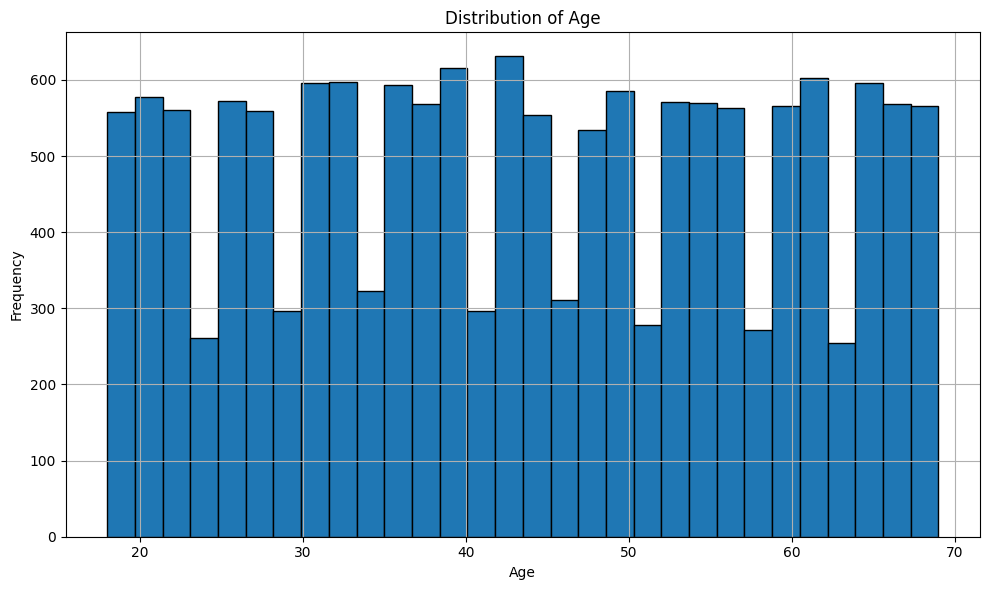

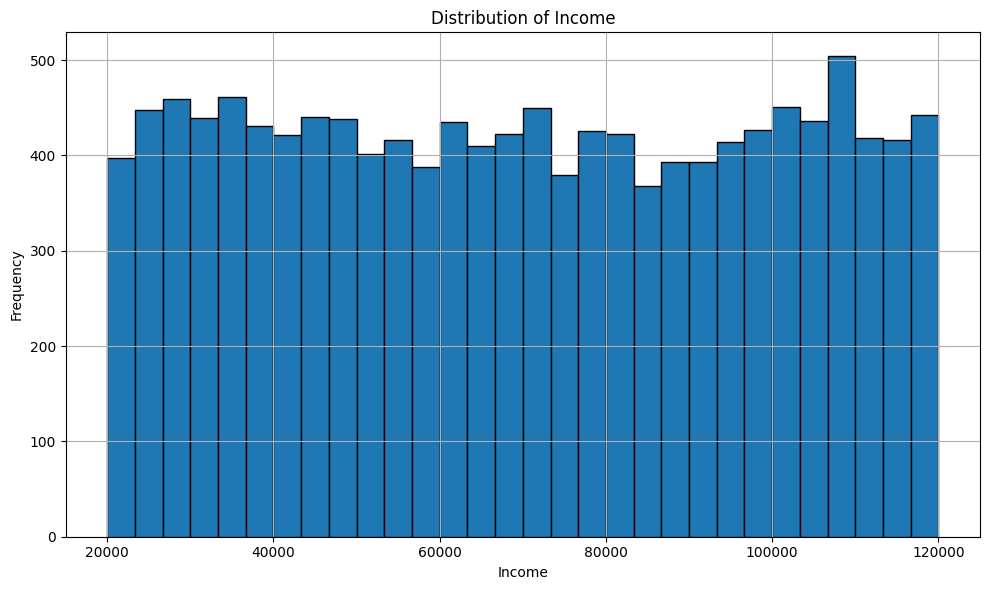

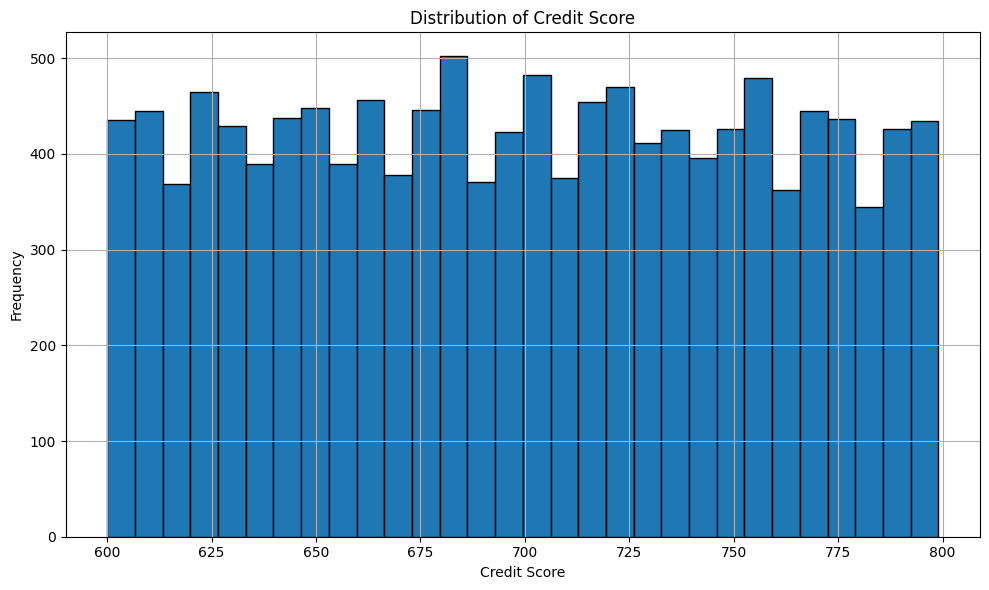

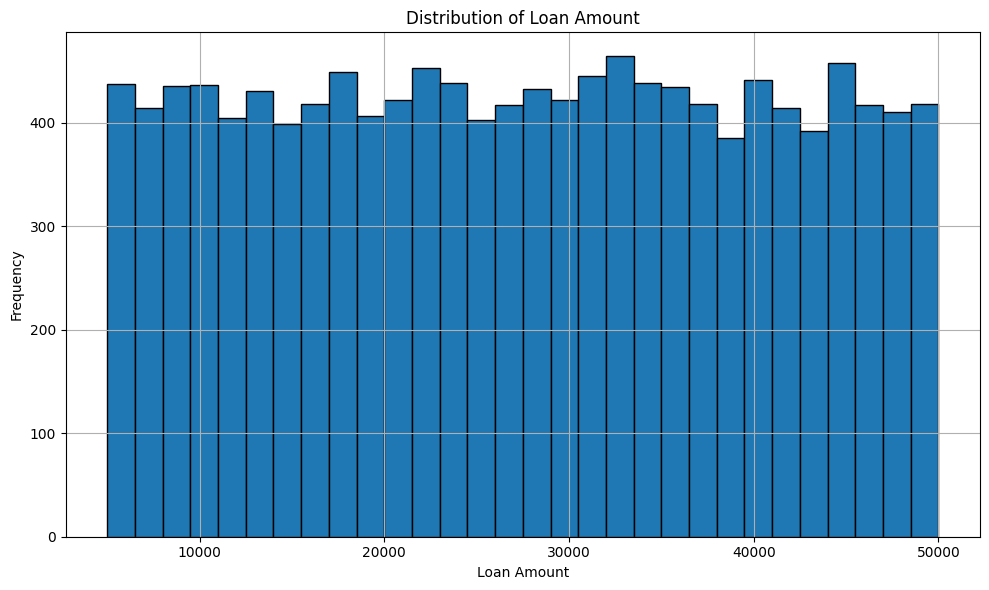

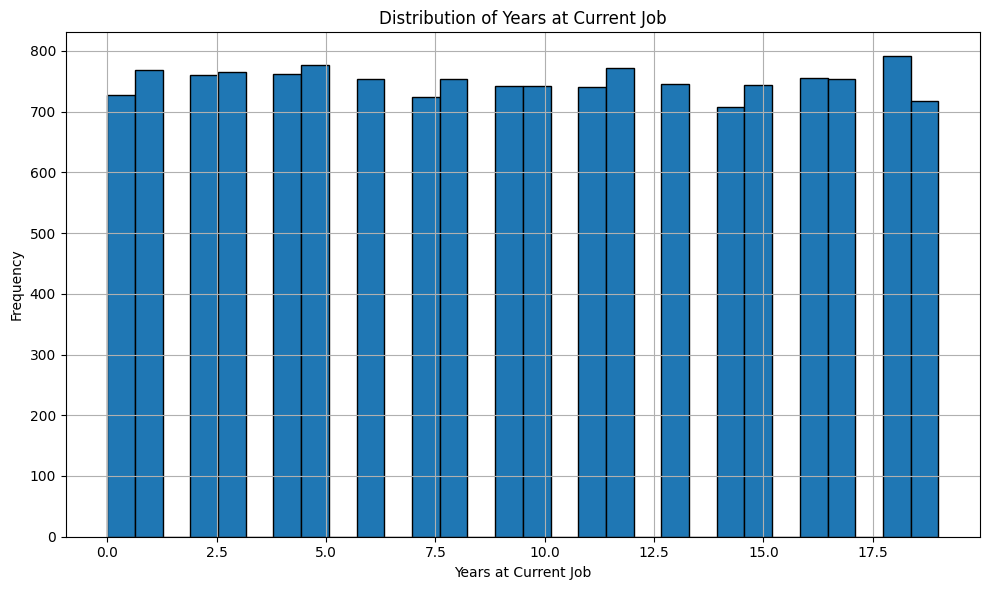

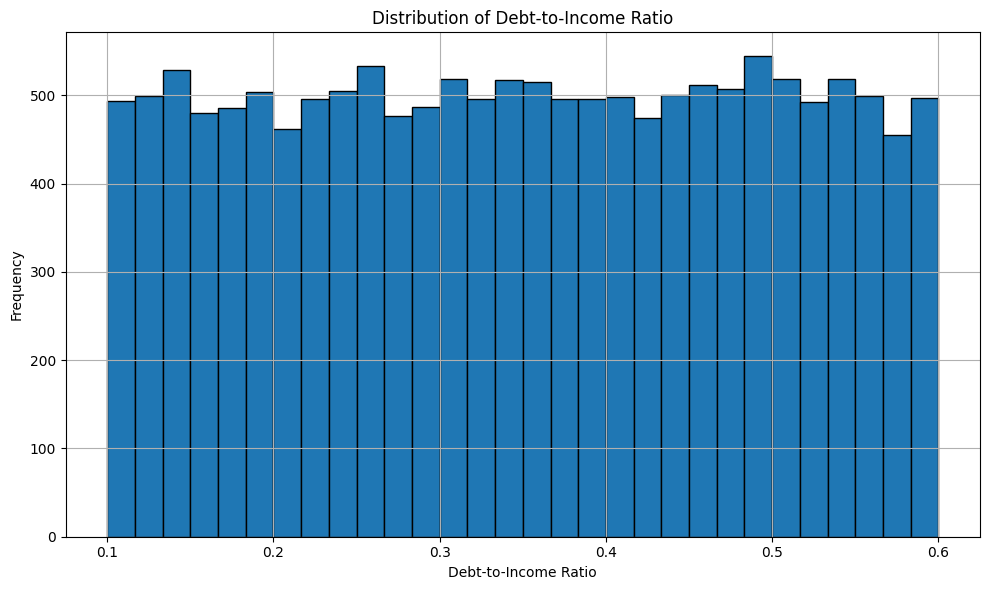

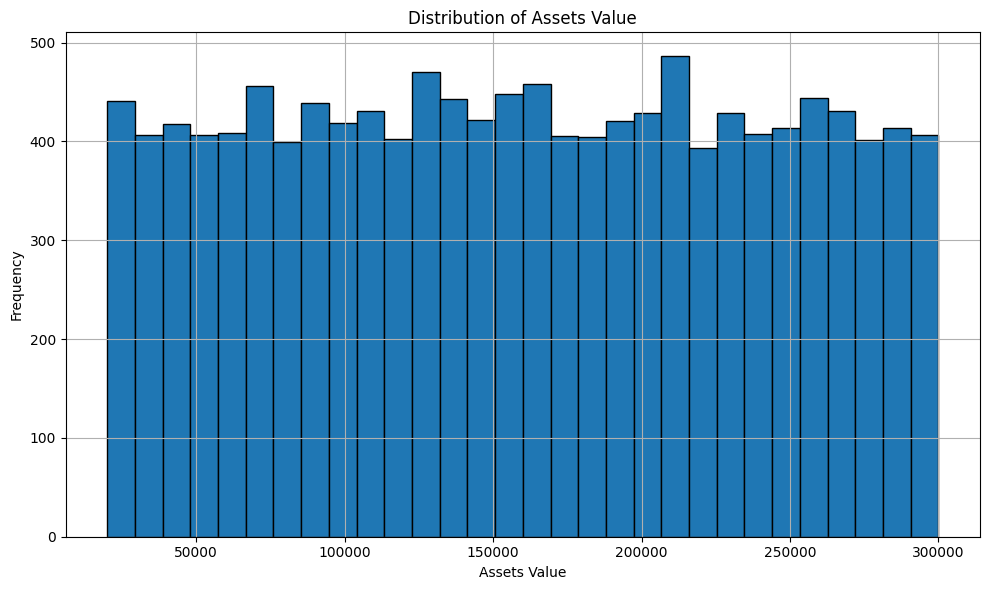

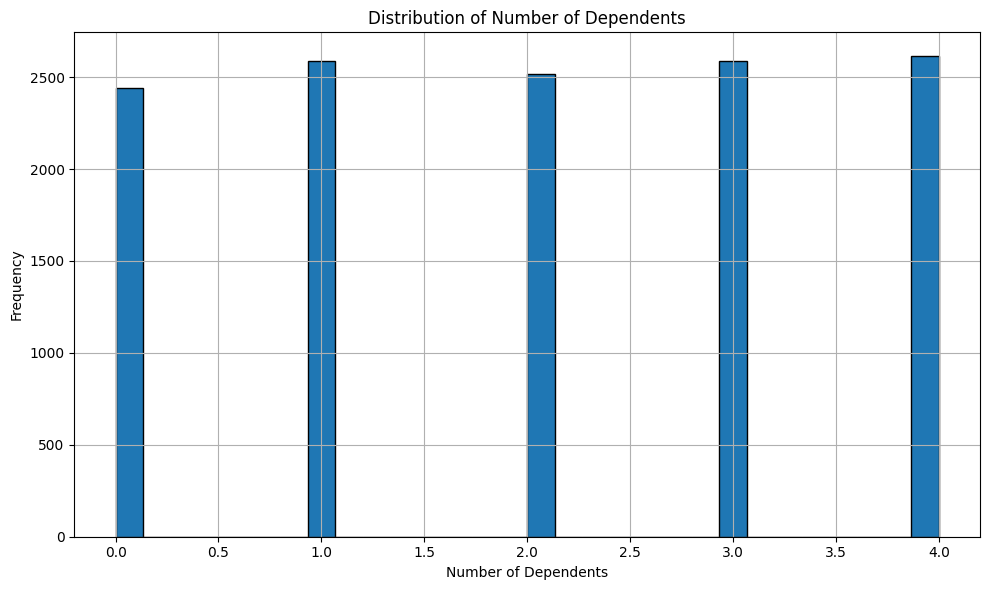

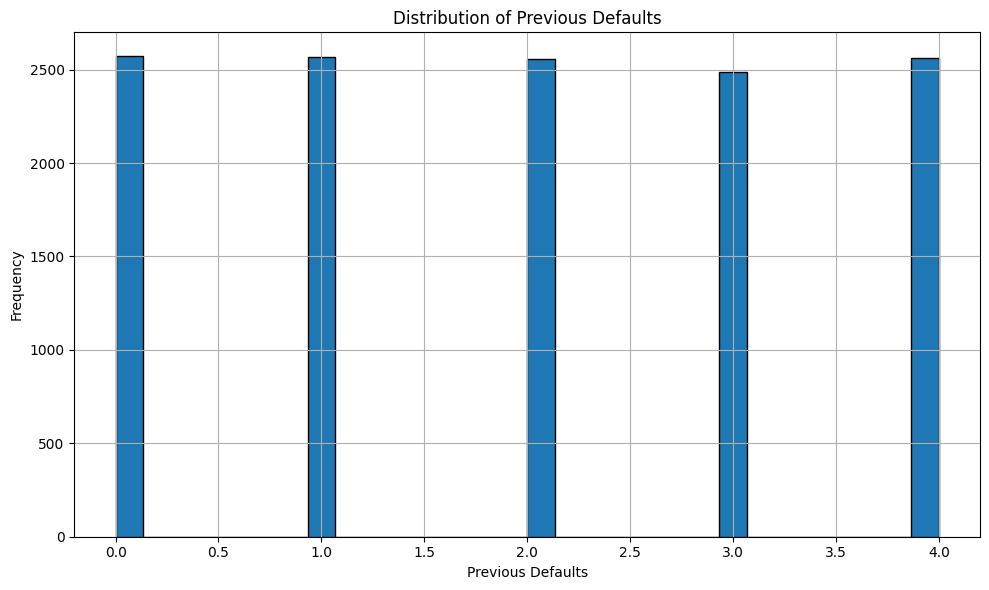

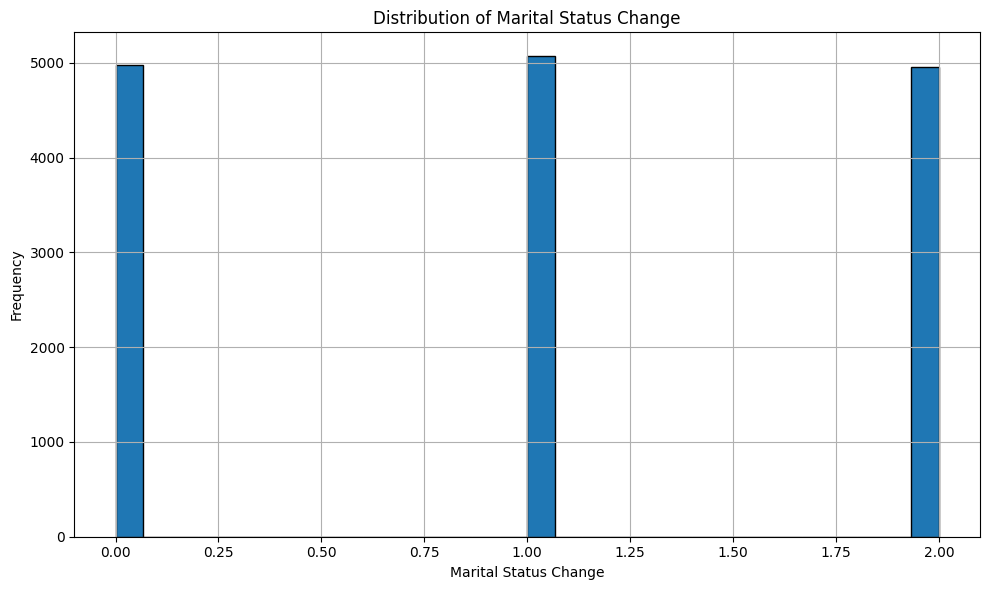

In [22]:
# Select only numeric columns
numeric_cols = df.select_dtypes(include=['number']).columns

# Plot each numeric column in a separate figure
for col in numeric_cols:
    plt.figure(figsize=(10, 6))
    df[col].hist(bins=30, edgecolor='black')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()

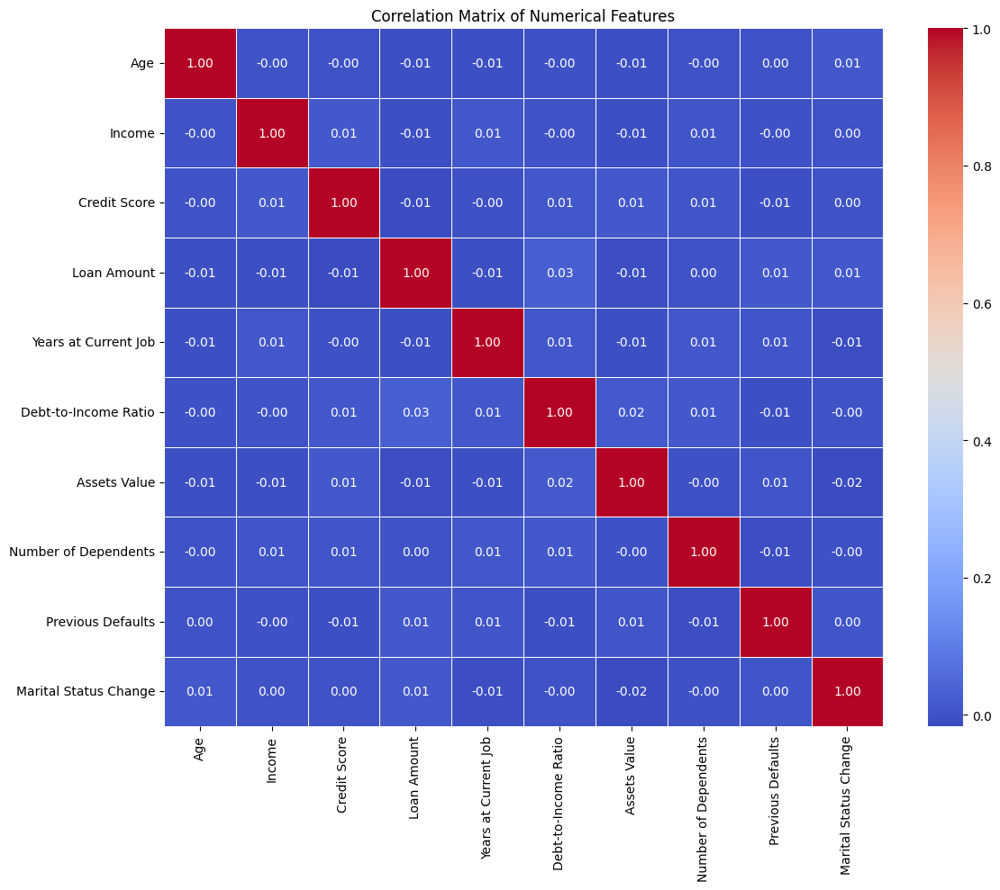

In [23]:
# Visualize the correlation between numerical features
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns
correlation_matrix = df[numerical_cols].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix of Numerical Features')
plt.tight_layout()
plt.show()

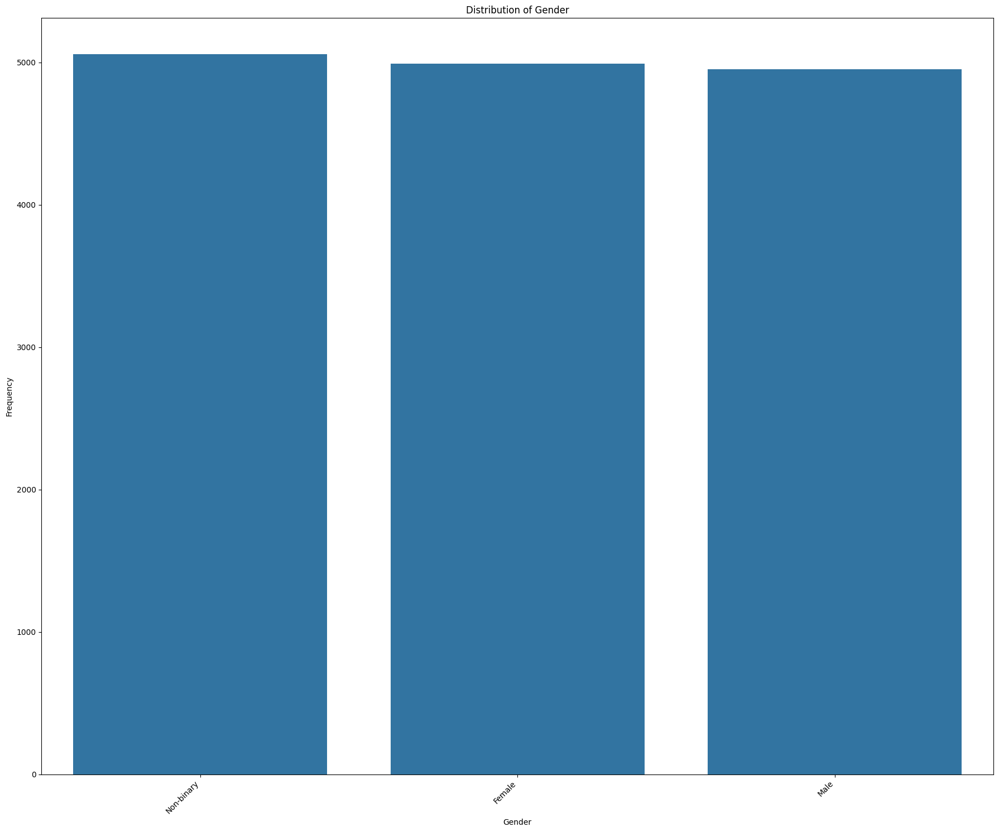

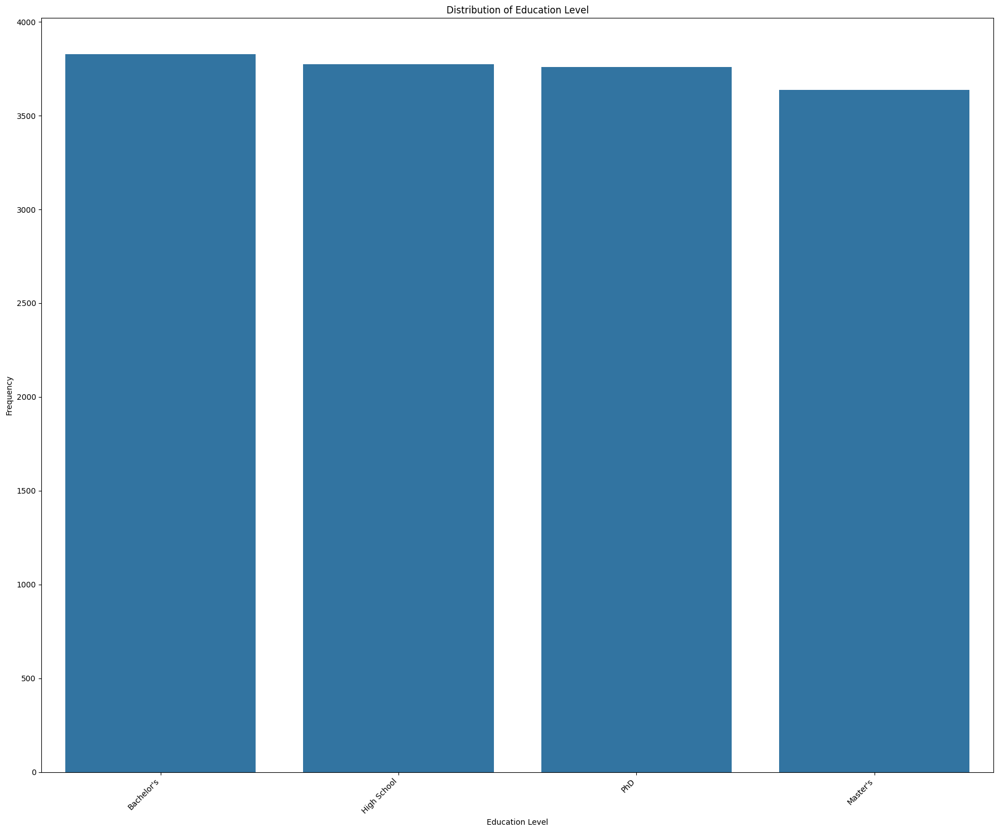

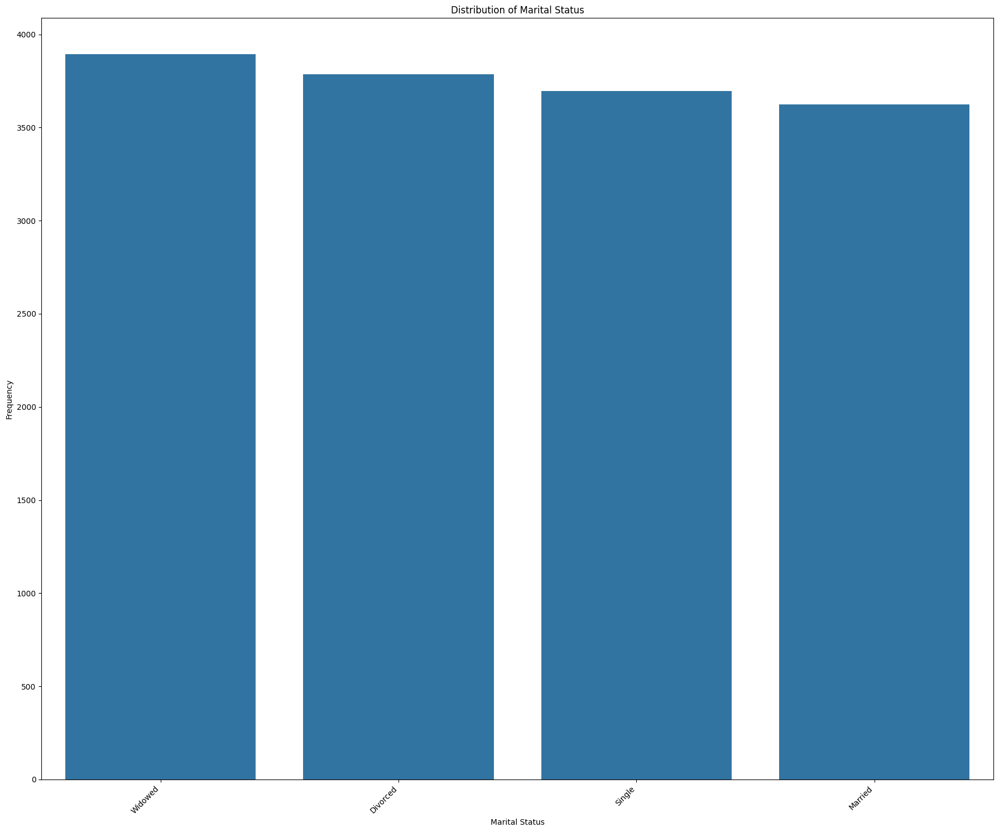

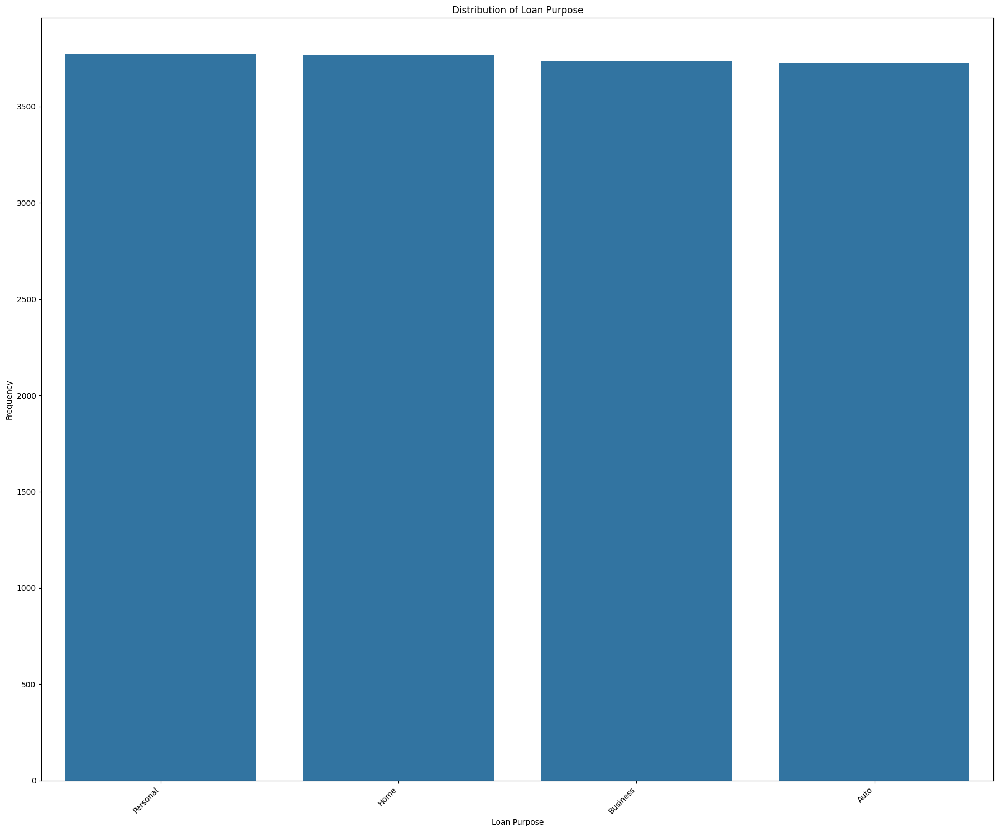

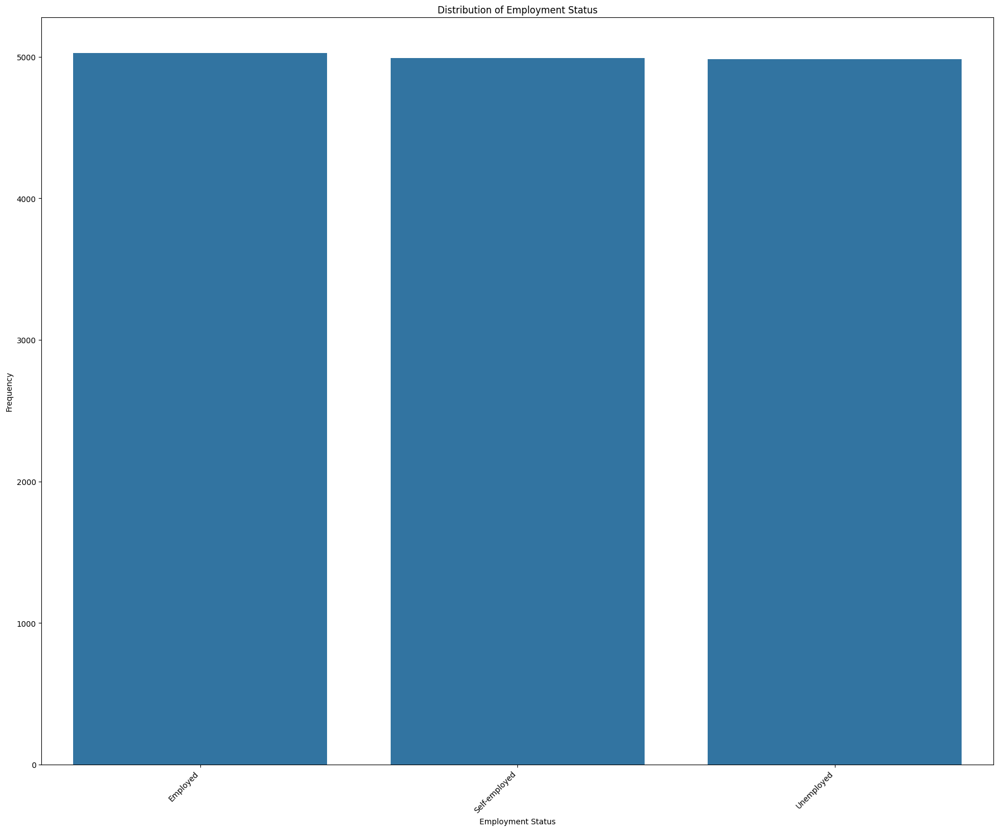

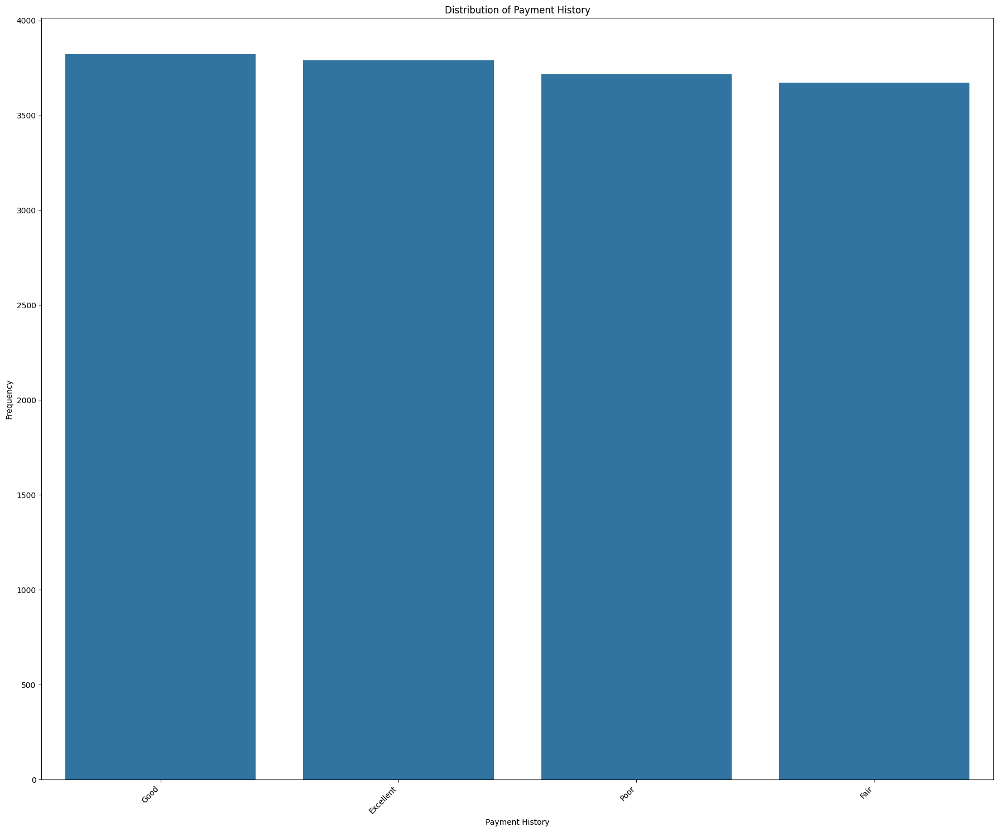

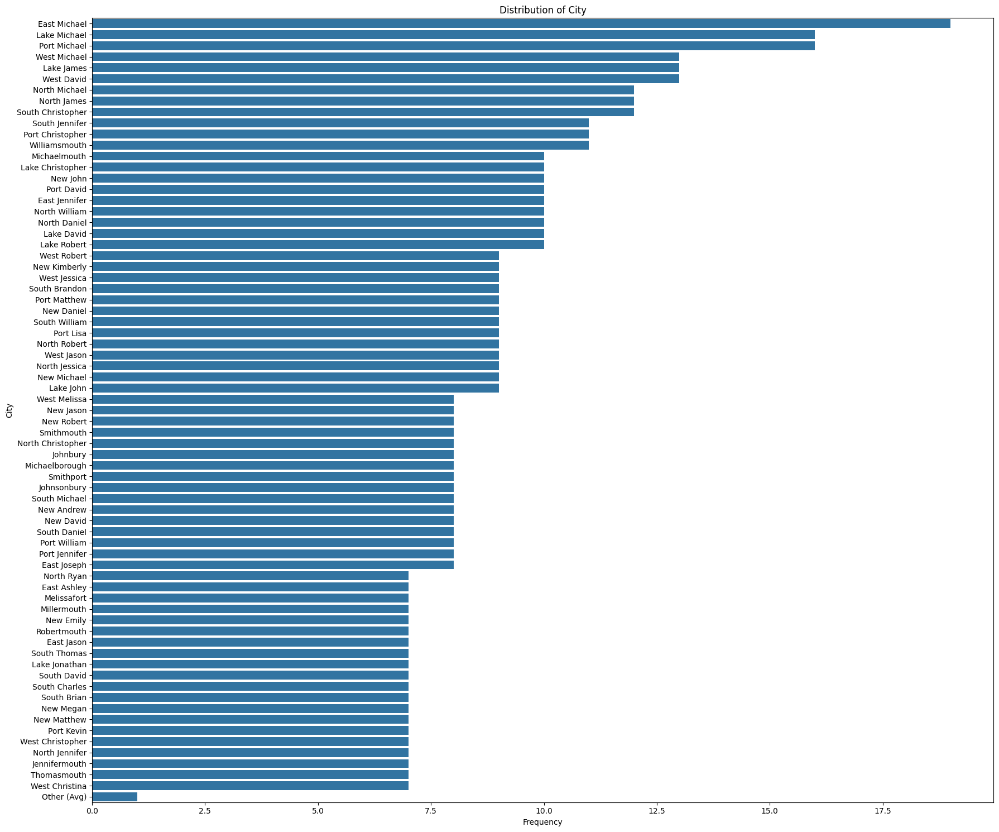

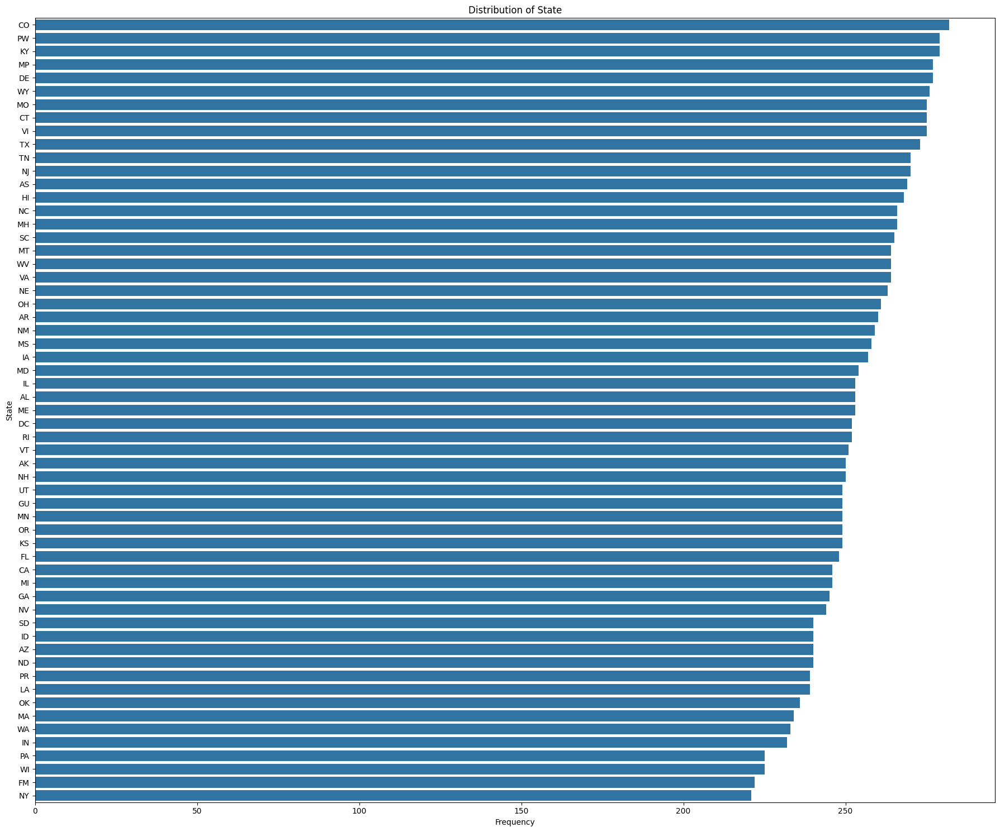

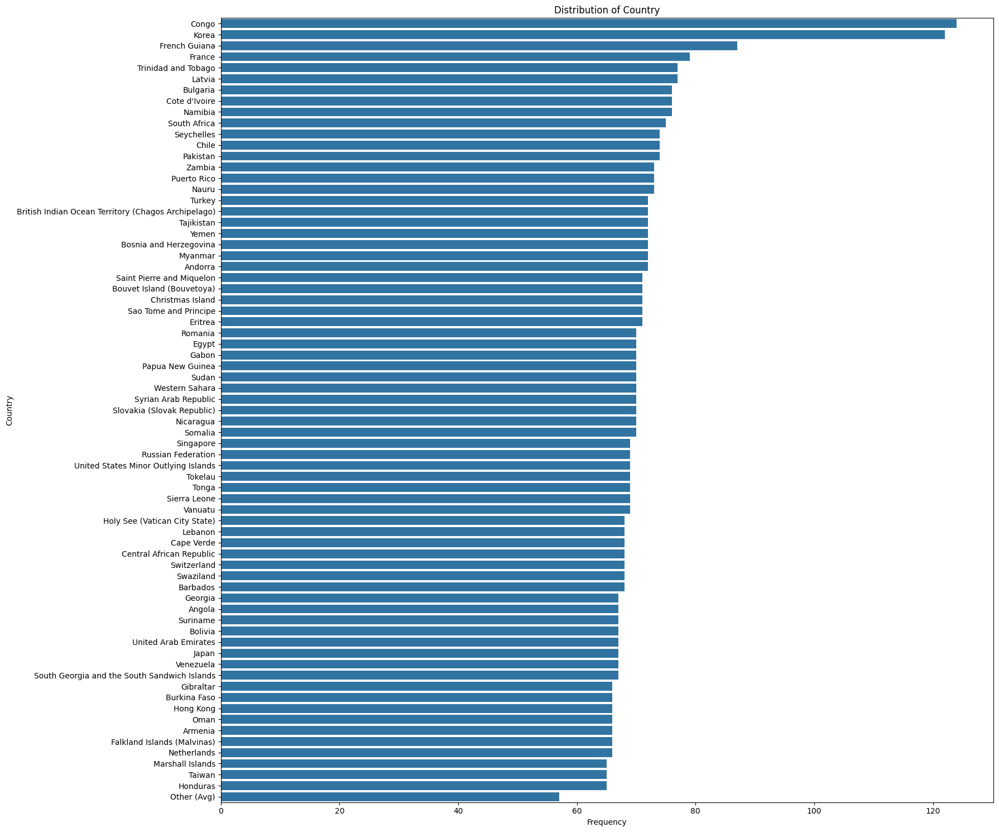

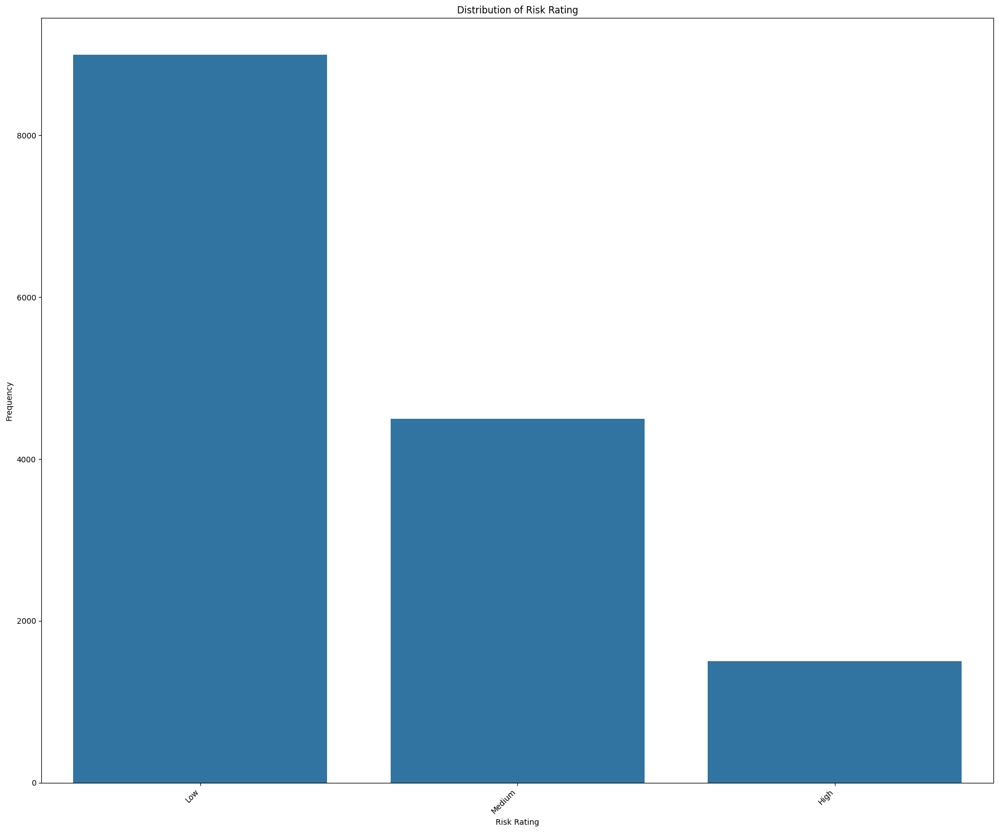

In [24]:
# Visualize the distribution of categorical variables

# Select categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns

# Plot each categorical variable
for col in categorical_cols:
    counts = df[col].value_counts()
    
    # Set top N categories
    top_n = 70
    if len(counts) > top_n:
        top_categories = counts[:top_n]
        other_categories = counts[top_n:]
        
        # Instead of sum, take mean frequency of the rest
        other_avg = int(other_categories.mean())
        top_categories["Other (Avg)"] = other_avg

        counts = top_categories

    else:
        counts = counts

    plt.figure(figsize=(18, 15))

    # Use horizontal barplot if too many labels
    if len(counts) > 10:
        sns.barplot(y=counts.index, x=counts.values)
        plt.xlabel("Frequency")
        plt.ylabel(col)
    else:
        sns.barplot(x=counts.index, y=counts.values)
        plt.xticks(rotation=45, ha='right')
        plt.ylabel("Frequency")
        plt.xlabel(col)

    plt.title(f'Distribution of {col}')
    plt.tight_layout()
    plt.show()



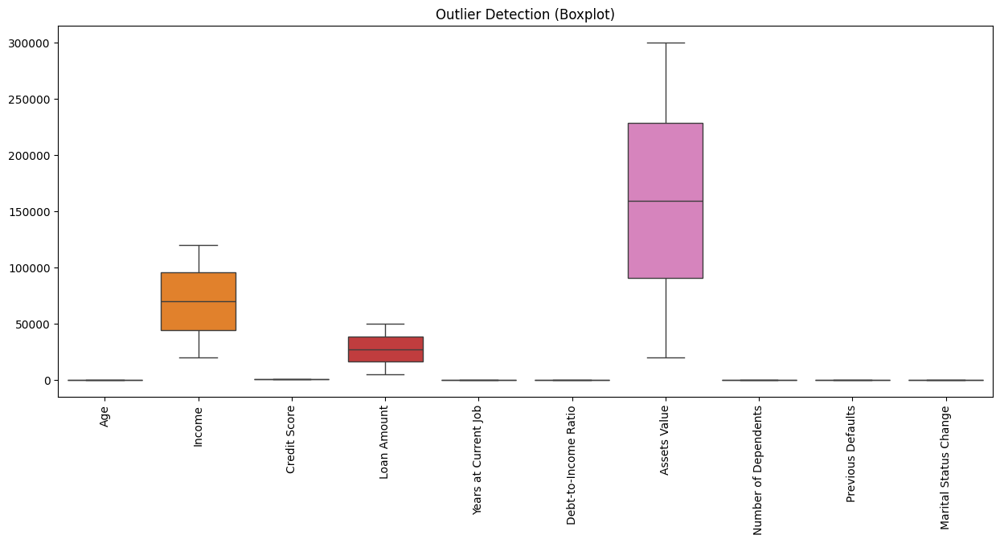

In [25]:
plt.figure(figsize=(15, 6))
sns.boxplot(data=df.select_dtypes(include=["number"]))
plt.xticks(rotation=90)
plt.title("Outlier Detection (Boxplot)")
plt.show()

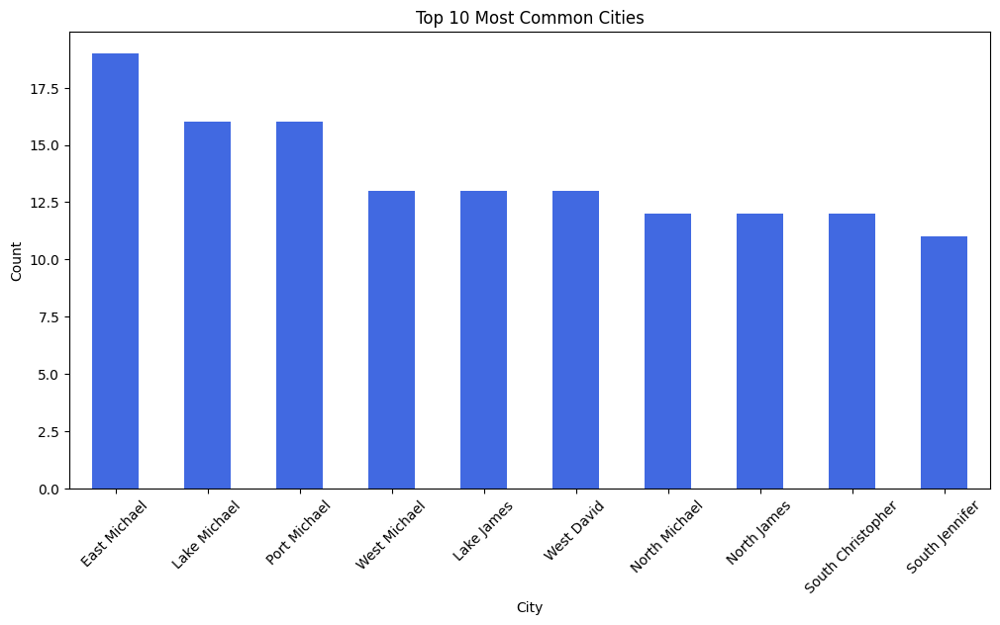

In [26]:
plt.figure(figsize=(12, 6))
df["City"].value_counts().head(10).plot(kind="bar", color="royalblue")
plt.title("Top 10 Most Common Cities")
plt.xlabel("City")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.show()

### Preprocessing Part

In [28]:
print(df.isnull().sum())  # Count of missing values per column

Age                         0
Gender                      0
Education Level             0
Marital Status              0
Income                   2250
Credit Score             2250
Loan Amount              2250
Loan Purpose                0
Employment Status           0
Years at Current Job        0
Payment History             0
Debt-to-Income Ratio        0
Assets Value             2250
Number of Dependents     2250
City                        0
State                       0
Country                     0
Previous Defaults        2250
Marital Status Change       0
Risk Rating                 0
dtype: int64


---
### Handling Missing Values

In this part, missing values are managed using a custom function that performs conditional imputation.


First, missing values are handled using conditional imputation. Numerical features such as Income, Credit Score, and Debt-to-Income Ratio are imputed by grouping related features (e.g., using Education Level for Income) and applying median values. For categorical features, conditions are set (e.g., setting Employment Status to 'Unemployed' when Years at Current Job equals 0) and the mode is used to fill remaining gaps.

In [30]:

# Define a function to handle missing values
def handle_missing_values(df):
    """
    Handle missing values in the dataset with conditional imputation
    Strategy:
    - For numerical features: Replace with conditional medians based on related features
    - For categorical features: Replace with conditional modes
    """
    df_processed = df.copy()
    
    # Handle numerical features
    numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns
    for col in numerical_cols:
        if df[col].isnull().sum() > 0:
            # Conditional imputation for Income based on Education Level
            if col == 'Income' and 'Education Level' in df.columns:
                # Group by education level and fill with group median
                education_groups = df.groupby('Education Level')[col].median()
                for edu_level, median_value in education_groups.items():
                    mask = (df['Education Level'] == edu_level) & df[col].isnull()
                    df_processed.loc[mask, col] = median_value
                
                # If any still missing, fill with overall median
                if df_processed[col].isnull().sum() > 0:
                    df_processed[col].fillna(df[col].median(), inplace=True)
            
            # Conditional imputation for Credit Score based on Payment History
            elif col == 'Credit Score' and 'Payment History' in df.columns:
                payment_groups = df.groupby('Payment History')[col].median()
                for history, median_value in payment_groups.items():
                    mask = (df['Payment History'] == history) & df[col].isnull()
                    df_processed.loc[mask, col] = median_value
                
                # Fill remaining missing values
                if df_processed[col].isnull().sum() > 0:
                    df_processed[col].fillna(df[col].median(), inplace=True)
            
            # Conditional imputation for Debt-to-Income Ratio
            elif col == 'Debt-to-Income Ratio' and 'Income' in df.columns:
                # Create income bins for conditional imputation
                df_processed['Income_Bin'] = pd.qcut(df_processed['Income'].fillna(df['Income'].median()), 
                                                    4, labels=['Low', 'Medium-Low', 'Medium-High', 'High'])
                for income_bin in df_processed['Income_Bin'].unique():
                    bin_median = df[df_processed['Income_Bin'] == income_bin][col].median()
                    mask = (df_processed['Income_Bin'] == income_bin) & df[col].isnull()
                    df_processed.loc[mask, col] = bin_median
                
                # Drop temporary column
                df_processed.drop('Income_Bin', axis=1, inplace=True)
                
                # Fill remaining missing values
                if df_processed[col].isnull().sum() > 0:
                    df_processed[col].fillna(df[col].median(), inplace=True)
                    
            # Default to standard median imputation for other numerical cols
            else:
                df_processed[col].fillna(df[col].median(), inplace=True)
    
    # Handle categorical features
    categorical_cols = df.select_dtypes(include=['object']).columns
    for col in categorical_cols:
        if df[col].isnull().sum() > 0:
            # For Employment Status, consider Years at Current Job
            if col == 'Employment Status' and 'Years at Current Job' in df.columns:
                # If years at job is 0, likely unemployed
                mask = df['Years at Current Job'] == 0
                df_processed.loc[mask & df[col].isnull(), col] = 'Unemployed'
                
                # For other missing values, use the mode
                if df_processed[col].isnull().sum() > 0:
                    df_processed[col].fillna(df[col].mode()[0], inplace=True)
            
            # For City/State pairs, ensure consistency
            elif col in ['City', 'State']:
                # If city is missing but state is not, fill with most common city in that state
                if col == 'City' and 'State' in df.columns:
                    for state in df['State'].dropna().unique():
                        most_common_city = df[df['State'] == state]['City'].mode()[0] if not df[df['State'] == state]['City'].mode().empty else "Unknown"
                        mask = (df['State'] == state) & df['City'].isnull()
                        df_processed.loc[mask, 'City'] = most_common_city
                
                # If state is missing but city is not, fill with most common state for that city
                elif col == 'State' and 'City' in df.columns:
                    for city in df['City'].dropna().unique():
                        most_common_state = df[df['City'] == city]['State'].mode()[0] if not df[df['City'] == city]['State'].mode().empty else "Unknown"
                        mask = (df['City'] == city) & df['State'].isnull()
                        df_processed.loc[mask, 'State'] = most_common_state
                
                # Fill any remaining missing values
                if df_processed[col].isnull().sum() > 0:
                    df_processed[col].fillna(df[col].mode()[0], inplace=True)
            
            # Standard mode imputation for other categorical features
            else:
                df_processed[col].fillna(df[col].mode()[0], inplace=True)
    
    return df_processed

---
In this part, new features are engineered and the dataset is transformed for modeling. Binning techniques are used to segment features like Credit Score, Income, and Age into meaningful groups, while interaction features such as Credit_Income_Ratio and DTI_Payment_Factor are created to capture complex relationships. Additionally, log transformations are applied to reduce skewness in variables like Income, and both ordinal and one-hot encoding methods are used based on feature characteristics.

In [33]:
def enhance_features_and_encode(df):
    """
    Enhanced feature engineering and encoding for the dataset
    """
    df_enhanced = df.copy()
    
    # 1. Create bins for important numerical features
    # Credit Score Bins
    if 'Credit Score' in df.columns:
        bins = [0, 650, 700, 750, 850]
        labels = ['Poor', 'Fair', 'Good', 'Excellent']
        df_enhanced['Credit_Score_Category'] = pd.cut(df_enhanced['Credit Score'], bins=bins, labels=labels)
    
    # Income Bins
    if 'Income' in df.columns:
        df_enhanced['Income_Category'] = pd.qcut(df_enhanced['Income'], q=4, labels=['Low', 'Medium-Low', 'Medium-High', 'High'])
    
    # Age Groups
    if 'Age' in df.columns:
        bins = [0, 25, 35, 45, 55, 100]
        labels = ['Young_Adult', 'Adult_1', 'Adult_2', 'Senior_1', 'Senior_2']
        df_enhanced['Age_Group'] = pd.cut(df_enhanced['Age'], bins=bins, labels=labels)
    
    # 2. Create interaction features
    # Credit score and income interaction (financial health indicator)
    if 'Credit Score' in df.columns and 'Income' in df.columns:
        df_enhanced['Credit_Income_Ratio'] = df_enhanced['Credit Score'] / (df_enhanced['Income'] + 1)
    
    # Debt to income and payment history interaction (risk indicator)
    if 'Debt-to-Income Ratio' in df.columns and 'Payment History' in df.columns:
        # Map payment history to numerical values
        payment_mapping = {'Excellent': 4, 'Good': 3, 'Fair': 2, 'Poor': 1}
        payment_numerical = df_enhanced['Payment History'].map(payment_mapping)
        
        # Higher values indicate lower risk
        df_enhanced['DTI_Payment_Factor'] = payment_numerical / (df_enhanced['Debt-to-Income Ratio'] + 0.1)
    
    # 3. Feature transformation
    # Log transform skewed numerical features
    for col in ['Income', 'Loan Amount', 'Assets Value']:
        if col in df.columns:
            df_enhanced[f'{col}_Log'] = np.log1p(df_enhanced[col])
    
    # 4. Categorical Encoding
    encoded_features = {}
    
    for col in df_enhanced.select_dtypes(include=['object', 'category']).columns:
        if col == 'Risk Rating':  # Target variable
            risk_mapping = {'Low': 0, 'Medium': 1, 'High': 2}
            df_enhanced[col] = df_enhanced[col].map(risk_mapping)
            encoded_features[col] = risk_mapping
        
        # Ordinal encoding for features with natural order
        elif col == 'Education Level':
            edu_mapping = {'High School': 0, 'Associate': 1, 'Bachelor': 2, 'Master': 3, 'PhD': 4}
            df_enhanced[col] = df_enhanced[col].map(edu_mapping)
            encoded_features[col] = edu_mapping
        
        elif col == 'Payment History':
            payment_mapping = {'Poor': 0, 'Fair': 1, 'Good': 2, 'Excellent': 3}
            df_enhanced[col] = df_enhanced[col].map(payment_mapping)
            encoded_features[col] = payment_mapping
        
        # One-hot encoding for categorical features with few categories
        elif df_enhanced[col].nunique() <= 5:
            for val in df_enhanced[col].unique():
                if pd.notna(val):
                    new_col = f"{col}_{val}"
                    df_enhanced[new_col] = (df_enhanced[col] == val).astype(int)
            df_enhanced.drop(col, axis=1, inplace=True)
        
        # For high-cardinality features, use frequency encoding plus binary flags for top categories
        else:
            # Frequency encoding
            val_counts = df_enhanced[col].value_counts(normalize=True)
            df_enhanced[f"{col}_Freq"] = df_enhanced[col].map(val_counts)
            
            # Create binary flags for top N categories
            top_categories = val_counts.nlargest(3).index.tolist()
            for cat in top_categories:
                df_enhanced[f"{col}_{cat}"] = (df_enhanced[col] == cat).astype(int)
            
            # Drop original column
            df_enhanced.drop(col, axis=1, inplace=True)
    
    return df_enhanced, encoded_features

---
In this part, categorical variables are converted into numerical values without using external libraries. One-hot encoding is applied for features with a small number of unique values, and label encoding is used for those with higher cardinality. The target variable, Risk Rating, is also mapped from textual categories to numerical labels.

In [35]:
# Define a function to encode categorical variables
def encode_categorical_features(df):
    """
    Encode categorical features without using external libraries.
    Use one-hot encoding for features with few categories and label encoding for others.
    """
    df_encoded = df.copy()
    encoded_features = {}
    
    for col in df.select_dtypes(include=['object']).columns:
        if col == 'Risk Rating':  # Target variable
            # Transform 'Low', 'Medium', 'High' to 0, 1, 2
            risk_mapping = {'Low': 0, 'Medium': 1, 'High': 2}
            df_encoded[col] = df[col].map(risk_mapping)
            encoded_features[col] = risk_mapping
        elif df[col].nunique() <= 5:  # One-hot encoding for columns with few categories
            unique_values = df[col].unique()
            for val in unique_values:
                if pd.notna(val):  # Exclude NaN values
                    new_col = f"{col}_{val}"
                    df_encoded[new_col] = (df[col] == val).astype(int)
            df_encoded.drop(col, axis=1, inplace=True)
        else:  # Label encoding for columns with many categories
            unique_values = df[col].unique()
            value_mapping = {val: i for i, val in enumerate(unique_values) if pd.notna(val)}
            df_encoded[col] = df[col].map(value_mapping)
            encoded_features[col] = value_mapping
    
    return df_encoded, encoded_features

In [37]:
warnings.filterwarnings("ignore")
# Apply preprocessing steps
print("\nHandling missing values...")
df_processed = handle_missing_values(df)

print("Encoding categorical features...")
df_encoded, feature_encodings = encode_categorical_features(df_processed)

# Check if all missing values have been handled
print(f"\nRemaining missing values after preprocessing: {df_encoded.isnull().sum().sum()}")

# Display the shape of the processed dataframe
print(f"Shape of the preprocessed dataframe: {df_encoded.shape}")




Handling missing values...
Encoding categorical features...

Remaining missing values after preprocessing: 0
Shape of the preprocessed dataframe: (15000, 36)


- After processing, the printout shows zero remaining missing values, confirming that the imputation strategy is effective.

- The shape of the preprocessed dataframe is updated to (15000, 36), indicating that additional features (like one-hot encoded columns) have been added.

---
- The dataset is split into training (70%), validation (15%), and test (15%) sets using the train_test_split function.

In [40]:
## 3. Split the data into train, validation, and test sets

# Extract features and target
X = df_encoded.drop('Risk Rating', axis=1)
y = df_encoded['Risk Rating']

# Split data into train (70%), validation (15%), and test (15%) sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

print("\nData split:")
print(f"Training set: {X_train.shape[0]} samples ({(X_train.shape[0]/X.shape[0])*100:.2f}%)")
print(f"Validation set: {X_val.shape[0]} samples ({(X_val.shape[0]/X.shape[0])*100:.2f}%)")
print(f"Test set: {X_test.shape[0]} samples ({(X_test.shape[0]/X.shape[0])*100:.2f}%)")


Data split:
Training set: 10500 samples (70.00%)
Validation set: 2250 samples (15.00%)
Test set: 2250 samples (15.00%)


---
### Implementing the ID3 Decision Tree Algorithm

This cell defines the core components of the ID3 algorithm:

    - The Node class encapsulates the decision tree structure.

    - The DecisionTree class and associated functions (entropy calculation, information gain, recursive tree building, prediction, and rule printing) implement the ID3 logic.

In [42]:
# Implementing ID3 Decision Tree from Scratch
# This cell includes the Node class, entropy calculation, information gain,
# recursive tree building, prediction, and printing of tree rules.

# Node class to represent each node in the tree
class Node:
    next_id = 0
    def __init__(self, feature=None, threshold=None, children=None, label=None, samples=None):
        self.feature = feature              # The feature used for splitting
        self.threshold = threshold          # Threshold value for continuous variables (None if categorical)
        self.children = children or {}      # Child nodes: {split_value: child_node}
        self.label = label                  # Class label for leaf nodes
        self.samples = samples              # Labels of the samples reaching this node (used for pruning)
        self.id = Node.next_id              # Unique node ID
        Node.next_id += 1

class DecisionTree:
    def __init__(self, max_depth=None, min_samples_split=2):
        self.max_depth = float('inf') if max_depth is None else max_depth
        self.min_samples_split = min_samples_split
        self.root = None
        self.features = None

    def fit(self, X, y, features):
        self.features = features
        self.root = build_tree(X, y, features, self.max_depth, self.min_samples_split)

    def predict(self, X):
        return predict_tree_batch(self.root, X)

    def print_rules(self):
        print_tree_rules(self.root)

    def find_twigs(self):
        """
        Finds internal nodes of the tree where all children are leaf nodes (twig nodes).
        """
        twigs = []
        def traverse(node):
            if node is None:
                return
            if node.label is None:
                if all(child.label is not None for child in node.children.values()):
                    twigs.append(node)
                else:
                    for child in node.children.values():
                        traverse(child)
        traverse(self.root)
        return twigs

    def calculate_information_gain(self, twig):
        """
        Calculates the information gain for a given twig node.
        Calculation: parent entropy - (weighted sum of child entropies)
        """
        parent_entropy = entropy(twig.samples)
        total_samples = len(twig.samples)
        child_entropy = 0.0
        for child in twig.children.values():
            weight = len(child.samples) / total_samples
            child_entropy += weight * entropy(child.samples)
        return parent_entropy - child_entropy

    def prune_twig(self, twig):
        """
        Prunes the twig node; removes child nodes and converts it into a leaf node.
        """
        majority_label = np.argmax(np.bincount(twig.samples))
        twig.label = majority_label
        twig.feature = None
        twig.threshold = None
        twig.children = {}

    def copy(self):
        """
        Creates a deep copy of the tree.
        """
        new_tree = DecisionTree(max_depth=self.max_depth, min_samples_split=self.min_samples_split)
        new_tree.features = self.features
        new_tree.root = self._copy_node(self.root)
        return new_tree

    def _copy_node(self, node):
        if node is None:
            return None
        new_node = Node(
            feature=node.feature, 
            threshold=node.threshold, 
            label=node.label,
            samples=node.samples.copy() if node.samples is not None else None
        )
        new_node.children = {key: self._copy_node(child) for key, child in node.children.items()}
        return new_node

# Function to calculate entropy of an array of labels
def entropy(y):
    counts = np.bincount(y)
    probabilities = counts / len(y)
    return -np.sum([p * np.log2(p) for p in probabilities if p > 0])

# Function to determine the best split based on information gain
def best_split(X, y, features, min_samples_split):
    y_arr = y.values if isinstance(y, pd.Series) else y
    best_feature = None
    best_threshold = None
    best_info_gain = 0
    current_entropy = entropy(y_arr)
    n = len(y_arr)
    if n < min_samples_split or current_entropy == 0:
         return None, None, 0
    for feature in features:
         values = X[feature]
         unique_values = np.unique(values)
         if len(unique_values) <= 1:
             continue
         # If more than 10 unique values, treat the feature as continuous
         if len(unique_values) > 10:
             threshold = np.median(values)
             left_mask = values <= threshold
             right_mask = values > threshold
             if np.sum(left_mask) == 0 or np.sum(right_mask) == 0:
                 continue
             entropy_left = entropy(y_arr[left_mask])
             entropy_right = entropy(y_arr[right_mask])
             weighted_entropy = (np.sum(left_mask)/n) * entropy_left + (np.sum(right_mask)/n) * entropy_right
             info_gain = current_entropy - weighted_entropy
             if info_gain > best_info_gain:
                 best_info_gain = info_gain
                 best_feature = feature
                 best_threshold = threshold
         else:  # Categorical feature
             weighted_entropy = 0
             for val in unique_values:
                 mask = (values == val)
                 weighted_entropy += (np.sum(mask)/n) * entropy(y_arr[mask])
             info_gain = current_entropy - weighted_entropy
             if info_gain > best_info_gain:
                 best_info_gain = info_gain
                 best_feature = feature
                 best_threshold = None
    return best_feature, best_threshold, best_info_gain

# Recursive function to build the ID3 tree
def build_tree(X, y, features, max_depth, min_samples_split):
    y_arr = y.values if isinstance(y, pd.Series) else y
    # If all labels are the same, return a leaf node
    if len(np.unique(y_arr)) == 1:
         return Node(label=y_arr[0], samples=y_arr.copy())
    if max_depth == 0 or len(y_arr) < min_samples_split:
         majority = np.argmax(np.bincount(y_arr))
         return Node(label=majority, samples=y_arr.copy())
    
    best_feature, best_threshold, best_info_gain = best_split(X, y, features, min_samples_split)
    if best_feature is None:
         majority = np.argmax(np.bincount(y_arr))
         return Node(label=majority, samples=y_arr.copy())
    
    node = Node(feature=best_feature, threshold=best_threshold, samples=y_arr.copy())
    
    if best_threshold is not None:
         # For continuous feature, create two branches: <= threshold and > threshold
         left_mask = X[best_feature] <= best_threshold
         right_mask = X[best_feature] > best_threshold
         node.children['<='] = build_tree(X[left_mask], y[left_mask], features, max_depth-1, min_samples_split)
         node.children['>'] = build_tree(X[right_mask], y[right_mask], features, max_depth-1, min_samples_split)
    else:
         # For categorical feature, create a branch for each unique value
         for val in np.unique(X[best_feature].values):
             mask = (X[best_feature] == val)
             node.children[val] = build_tree(X[mask], y[mask], features, max_depth-1, min_samples_split)
    return node

# Function to predict the class label for a single instance using the tree
def predict_tree(node, x):
    # If node is a leaf, return its label
    if node.label is not None:
         return node.label
    # Get the feature value for the current node's splitting feature
    feature_val = x[node.feature]
    if node.threshold is not None:
         # Continuous feature: choose branch based on threshold comparison
         if feature_val <= node.threshold:
              child = node.children.get('<=', None)
         else:
              child = node.children.get('>', None)
         if child is None:
              # Fallback: return majority class at current node
              return np.argmax(np.bincount(node.samples))
         return predict_tree(child, x)
    else:
         # Categorical feature: choose branch based on matching feature value
         child = node.children.get(feature_val, None)
         if child is None:
              # Fallback: return majority class at current node
              return np.argmax(np.bincount(node.samples))
         return predict_tree(child, x)

# Function to predict class labels for an entire dataset
def predict_tree_batch(root, X):
    preds = []
    for idx in X.index:
         preds.append(predict_tree(root, X.loc[idx]))
    return np.array(preds)

# Function to print all root-to-leaf paths (rules) of the tree
def print_tree_rules(node, rule=""):
    if node.label is not None:
         print(rule + " THEN class =", node.label)
         return
    if node.threshold is not None:
         # For continuous features: print rule for <= and > threshold
         print_tree_rules(node.children['<='], rule + f" IF {node.feature} <= {node.threshold:.2f} ")
         print_tree_rules(node.children['>'], rule + f" IF {node.feature} > {node.threshold:.2f} ")
    else:
         # For categorical features: print rules for each branch in order
         for key in sorted(node.children.keys()):
              print_tree_rules(node.children[key], rule + f" IF {node.feature} == {key} ")


---
### Hyperparameter Tuning and Model Evaluation

Here, multiple decision tree models are trained with various combinations of max_depth and min_samples_split. For each configuration, you calculate and print metrics (accuracy, precision, recall, F1 score) for training, validation, and test sets.

In [44]:
## Train and evaluate different decision tree models and report metrics

# Define hyperparameters to try
max_depths = [3, 5, 7, 10, None]
min_samples_splits = [2, 5, 10]

# Initialize variables to store results
results = []

# Train multiple decision tree models with different hyperparameters
for max_depth in max_depths:
    for min_samples_split in min_samples_splits:
        print(f"\nTraining Decision Tree with max_depth={max_depth}, min_samples_split={min_samples_split}")
        
        # Initialize and train the model
        dt = DecisionTree(max_depth=max_depth, min_samples_split=min_samples_split)
        dt.fit(X_train, y_train, X.columns)
        
        # Make predictions on train and test sets
        train_preds = dt.predict(X_train)
        test_preds = dt.predict(X_test)
        val_preds = dt.predict(X_val)
        
        # Calculate metrics for training set
        train_accuracy = accuracy_score(y_train, train_preds)
        train_precision = precision_score(y_train, train_preds, average='weighted')
        train_recall = recall_score(y_train, train_preds, average='weighted')
        train_f1 = f1_score(y_train, train_preds, average='weighted')
        
        # Calculate metrics for test set
        test_accuracy = accuracy_score(y_test, test_preds)
        test_precision = precision_score(y_test, test_preds, average='weighted')
        test_recall = recall_score(y_test, test_preds, average='weighted')
        test_f1 = f1_score(y_test, test_preds, average='weighted')
        
        # Calculate metrics for validation set
        val_accuracy = accuracy_score(y_val, val_preds)
        val_precision = precision_score(y_val, val_preds, average='weighted')
        val_recall = recall_score(y_val, val_preds, average='weighted')
        val_f1 = f1_score(y_val, val_preds, average='weighted')
        
        # Store the results
        result = {
            'max_depth': max_depth,
            'min_samples_split': min_samples_split,
            'train_accuracy': train_accuracy,
            'train_precision': train_precision,
            'train_recall': train_recall,
            'train_f1': train_f1,
            'test_accuracy': test_accuracy,
            'test_precision': test_precision,
            'test_recall': test_recall,
            'test_f1': test_f1,
            'val_accuracy': val_accuracy,
            'val_precision': val_precision,
            'val_recall': val_recall,
            'val_f1': val_f1
        }
        results.append(result)
        


Training Decision Tree with max_depth=3, min_samples_split=2

Training Decision Tree with max_depth=3, min_samples_split=5

Training Decision Tree with max_depth=3, min_samples_split=10

Training Decision Tree with max_depth=5, min_samples_split=2

Training Decision Tree with max_depth=5, min_samples_split=5

Training Decision Tree with max_depth=5, min_samples_split=10

Training Decision Tree with max_depth=7, min_samples_split=2

Training Decision Tree with max_depth=7, min_samples_split=5

Training Decision Tree with max_depth=7, min_samples_split=10

Training Decision Tree with max_depth=10, min_samples_split=2

Training Decision Tree with max_depth=10, min_samples_split=5

Training Decision Tree with max_depth=10, min_samples_split=10

Training Decision Tree with max_depth=None, min_samples_split=2

Training Decision Tree with max_depth=None, min_samples_split=5

Training Decision Tree with max_depth=None, min_samples_split=10


,max_depth,min_samples_split,train_accuracy,train_precision,train_recall,train_f1,test_accuracy,test_precision,test_recall,test_f1,val_accuracy,val_precision,val_recall,val_f1
0,3.0,2,0.600762,0.360915,0.600762,0.450929,0.600000,0.360000,0.600000,0.450000,0.596444,0.355746,0.596444,0.445673
1,3.0,5,0.600762,0.360915,0.600762,0.450929,0.600000,0.360000,0.600000,0.450000,0.596444,0.355746,0.596444,0.445673
2,3.0,10,0.600762,0.360915,0.600762,0.450929,0.600000,0.360000,0.600000,0.450000,0.596444,0.355746,0.596444,0.445673
3,5.0,2,0.611238,0.599076,0.611238,0.514865,0.571111,0.481807,0.571111,0.470049,0.579556,0.455031,0.579556,0.472665
4,5.0,5,0.611238,0.599076,0.611238,0.514865,0.571111,0.481807,0.571111,0.470049,0.579556,0.455031,0.579556,0.472665
5,5.0,10,0.611238,0.599076,0.611238,0.514865,0.571111,0.481807,0.571111,0.470049,0.579556,0.455031,0.579556,0.472665
6,7.0,2,0.700286,0.708372,0.700286,0.666999,0.532000,0.445933,0.532000,0.473316,0.533778,0.459963,0.533778,0.476828
7,7.0,5,0.696190,0.702752,0.696190,0.661521,0.531556,0.445181,0.531556,0.472680,0.533778,0.459963,0.533778,0.476828
8,7.0,10,0.679429,0.680070,0.679429,0.638423,0.532444,0.446280,0.532444,0.473622,0.534222,0.459929,0.534222,0.476822
9,10.0,2,0.970095,0.970314,0.970095,0.969940,0.494667,0.454413,0.494667,0.470863,0.508889,0.465627,0.508889,0.481736


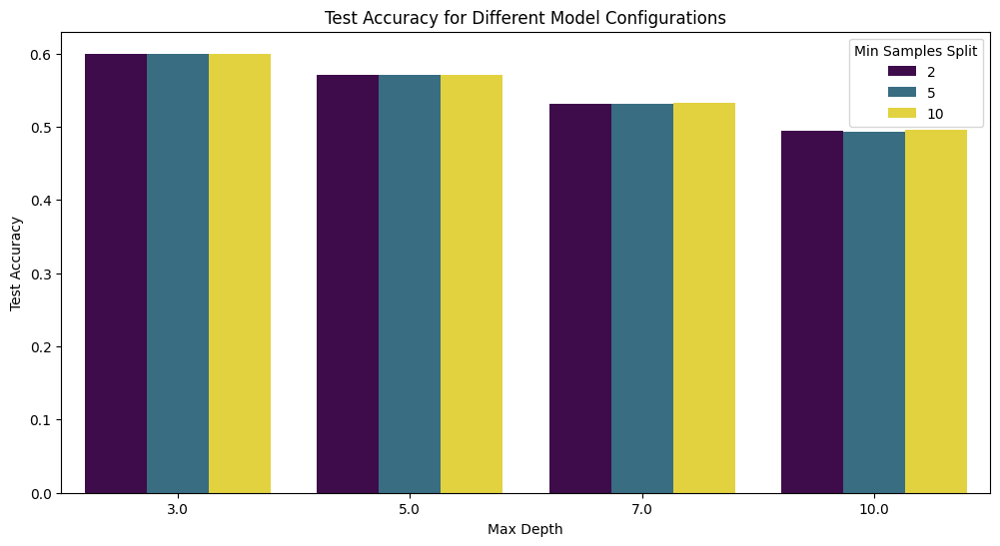

In [45]:
# Convert the results list (from hyperparameter tuning) into a DataFrame
results_df = pd.DataFrame(results)

# Display the results as a formatted table
display(results_df)

# Create a bar chart for test accuracy by different configurations
plt.figure(figsize=(12, 6))
sns.barplot(data=results_df, x='max_depth', y='test_accuracy', hue='min_samples_split', palette='viridis')
plt.title('Test Accuracy for Different Model Configurations')
plt.xlabel('Max Depth')
plt.ylabel('Test Accuracy')
plt.legend(title='Min Samples Split')
plt.show()

- The results reveal that while increasing tree depth improves training accuracy, the test and validation accuracies do not improve accordingly, indicating overfitting.

- The printed misclassified examples (with their features, true labels, and predicted labels) highlight cases where the model struggles, suggesting that these instances may have ambiguous or borderline feature values.

---
### Analyzing Misclassified Examples

This cell identifies and prints details of misclassified examples from the test set.

In [48]:

# y_pred: Predictions obtained using the root node of the DecisionTree object
y_pred = predict_tree_batch(dt.root, X_test)

misclassified_idx = (y_test != y_pred)
misclassified_data = X_test[misclassified_idx]
misclassified_true = y_test[misclassified_idx]
misclassified_pred = y_pred[misclassified_idx]

# Determine the number of instances to visualize (up to 5 examples)
num_instances = min(5, len(misclassified_data))

for i in range(num_instances):
    # For each instance, get the features, true label, and predicted label
    features = misclassified_data.iloc[i]
    true_label = misclassified_true.iloc[i]
    pred_label = misclassified_pred[i]
    
    # Create a DataFrame for the label information
    df_labels = pd.DataFrame({
        "Feature": ["True Label", "Predicted Label"],
        "Value": [true_label, pred_label]
    })
    
    # Convert the instance data to a DataFrame with 'Feature' and 'Value' columns
    df_instance = features.reset_index()
    df_instance.columns = ["Feature", "Value"]
    
    # Concatenate the label information with the instance features
    df_display = pd.concat([df_labels, df_instance], ignore_index=True)
    
    # Display the DataFrame with a markdown header for clarity
    display(Markdown(f"### Misclassified Instance {i+1}"))
    display(df_display)

### Misclassified Instance 1

,Feature,Value
0,True Label,0.000000
1,Predicted Label,1.000000
2,Age,62.000000
3,Income,23044.000000
4,Credit Score,775.000000
5,Loan Amount,49408.000000
6,Years at Current Job,11.000000
7,Debt-to-Income Ratio,0.354048
8,Assets Value,159362.000000
9,Number of Dependents,0.000000


### Misclassified Instance 2

,Feature,Value
0,True Label,1.000000
1,Predicted Label,0.000000
2,Age,19.000000
3,Income,69695.000000
4,Credit Score,626.000000
5,Loan Amount,41316.000000
6,Years at Current Job,0.000000
7,Debt-to-Income Ratio,0.103289
8,Assets Value,244728.000000
9,Number of Dependents,3.000000


### Misclassified Instance 3

,Feature,Value
0,True Label,0.000000
1,Predicted Label,2.000000
2,Age,49.000000
3,Income,25681.000000
4,Credit Score,763.000000
5,Loan Amount,44043.000000
6,Years at Current Job,16.000000
7,Debt-to-Income Ratio,0.362254
8,Assets Value,248369.000000
9,Number of Dependents,2.000000


### Misclassified Instance 4

,Feature,Value
0,True Label,0.000000
1,Predicted Label,1.000000
2,Age,44.000000
3,Income,36076.000000
4,Credit Score,750.000000
5,Loan Amount,33764.000000
6,Years at Current Job,10.000000
7,Debt-to-Income Ratio,0.521302
8,Assets Value,221534.000000
9,Number of Dependents,2.000000


### Misclassified Instance 5

,Feature,Value
0,True Label,0.000000
1,Predicted Label,2.000000
2,Age,58.000000
3,Income,54837.000000
4,Credit Score,670.000000
5,Loan Amount,16969.000000
6,Years at Current Job,13.000000
7,Debt-to-Income Ratio,0.340402
8,Assets Value,238618.000000
9,Number of Dependents,2.000000


In [49]:
# Identify misclassified indices
misclassified_indices = np.where(test_preds != y_test)[0]

# Create a DataFrame for misclassified examples
misclassified_df = pd.DataFrame({
    "Index": misclassified_indices,
    "True Label": y_test.iloc[misclassified_indices].values,
    "Predicted Label": test_preds[misclassified_indices]
})

# Optionally, add a few key features for further analysis
key_features = X_test.iloc[misclassified_indices][['Age', 'Income', 'Credit Score', 'Loan Amount', 'Years at Current Job']]
misclassified_df = pd.concat([misclassified_df, key_features.reset_index(drop=True)], axis=1)

# Display the first 5 misclassified examples
display(misclassified_df.head())

,Index,True Label,Predicted Label,Age,Income,Credit Score,Loan Amount,Years at Current Job
0,0,0,1,62,23044.0,775.0,49408.0,11
1,1,1,0,19,69695.0,626.0,41316.0,0
2,2,0,2,49,25681.0,763.0,44043.0,16
3,3,0,1,44,36076.0,750.0,33764.0,10
4,4,0,2,58,54837.0,670.0,16969.0,13


- The output shows that 1,148 samples are misclassified. For a few selected cases, both the true and predicted labels are displayed along with key features.

- The analysis of these examples can help explain possible reasons for misclassification, such as noise in the data or borderline values in the feature space.

In [51]:
# Convert results to a DataFrame
results_df = pd.DataFrame(results)

# Find the best model based on validation F1 score
best_model_idx = results_df['val_f1'].idxmax()
best_model_params = results_df.iloc[best_model_idx]

print("\nBest model parameters:")
print(f"max_depth: {best_model_params['max_depth']}")
print(f"min_samples_split: {best_model_params['min_samples_split']}")
print(f"Validation Accuracy: {best_model_params['val_accuracy']:.4f}")
print(f"Validation F1 Score: {best_model_params['val_f1']:.4f}")
print(f"Test Accuracy: {best_model_params['test_accuracy']:.4f}")
print(f"Test F1 Score: {best_model_params['test_f1']:.4f}")


Best model parameters:
max_depth: nan
min_samples_split: 5.0
Validation Accuracy: 0.5093
Validation F1 Score: 0.4831
Test Accuracy: 0.4898
Test F1 Score: 0.4661


In [52]:
# Train the best model again
best_dt = DecisionTree(
    max_depth=best_model_params['max_depth'],
    min_samples_split=best_model_params['min_samples_split']
)
best_dt.fit(X_train, y_train, X.columns)

In [53]:
# Make predictions on all sets
train_preds = best_dt.predict(X_train)
val_preds = best_dt.predict(X_val)
test_preds = best_dt.predict(X_test)

# Calculate confusion matrices
train_conf_matrix = confusion_matrix(y_train, train_preds)
val_conf_matrix = confusion_matrix(y_val, val_preds)
test_conf_matrix = confusion_matrix(y_test, test_preds)

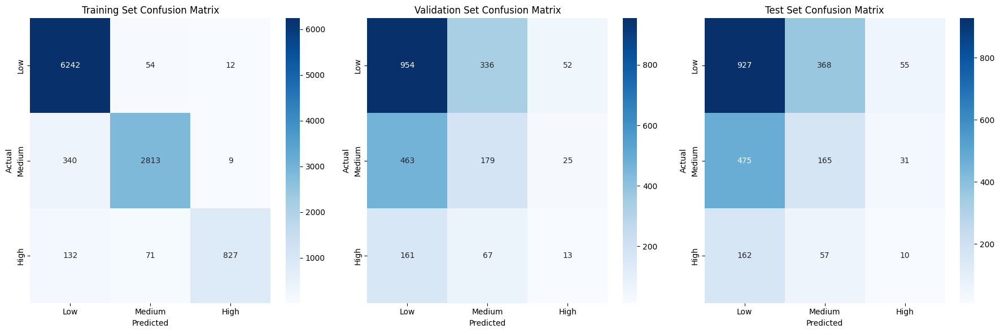

In [55]:
# Plot confusion matrices
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Training set confusion matrix
sns.heatmap(train_conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Low', 'Medium', 'High'],
            yticklabels=['Low', 'Medium', 'High'],
            ax=axes[0])
axes[0].set_xlabel('Predicted')
axes[0].set_ylabel('Actual')
axes[0].set_title('Training Set Confusion Matrix')

# Validation set confusion matrix
sns.heatmap(val_conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Low', 'Medium', 'High'],
            yticklabels=['Low', 'Medium', 'High'],
            ax=axes[1])
axes[1].set_xlabel('Predicted')
axes[1].set_ylabel('Actual')
axes[1].set_title('Validation Set Confusion Matrix')

# Test set confusion matrix
sns.heatmap(test_conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Low', 'Medium', 'High'],
            yticklabels=['Low', 'Medium', 'High'],
            ax=axes[2])
axes[2].set_xlabel('Predicted')
axes[2].set_ylabel('Actual')
axes[2].set_title('Test Set Confusion Matrix')

plt.tight_layout()
plt.show()

In [56]:


# Capture the printed tree rules into a string
f = io.StringIO()
with redirect_stdout(f):
    best_dt.print_rules()
rules_output = f.getvalue()

# Split the captured output into individual rules
rules_list = rules_output.strip().split("\n")

# Create a DataFrame to display the rules neatly
rules_df = pd.DataFrame({'Decision Tree Rules': rules_list})


# Show all rows (or set a high number) and untruncate column width
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

display(rules_df)  # rules_df is the DataFrame containing your rules

,Decision Tree Rules
0,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 0.0 IF Years at Current Job == 0 THEN class = 1
1,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 0.0 IF Years at Current Job == 4 THEN class = 0
2,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 0.0 IF Years at Current Job == 6 THEN class = 0
3,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 0.0 IF Years at Current Job == 7 THEN class = 0
4,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 0.0 IF Years at Current Job == 10 THEN class = 0
5,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 0.0 IF Years at Current Job == 11 THEN class = 0
6,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 0.0 IF Years at Current Job == 14 THEN class = 0
7,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 0.0 IF Years at Current Job == 16 THEN class = 0
8,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 0.0 IF Years at Current Job == 17 THEN class = 0
9,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 1.0 IF Marital Status_Widowed == 0 THEN class = 0


### Number of misclassified samples: 1148

### Analyzing misclassified samples:

,Misclassified Sample,Actual Risk Rating,Predicted Risk Rating,Age,Income,Credit Score,Loan Amount,Years at Current Job
0,Sample 1,0,1,62.0,23044.0,775.0,49408.0,11.0
1,Sample 2,1,0,19.0,69695.0,626.0,41316.0,0.0
2,Sample 3,0,2,49.0,25681.0,763.0,44043.0,16.0
3,Sample 4,0,1,44.0,36076.0,750.0,33764.0,10.0
4,Sample 5,0,2,58.0,54837.0,670.0,16969.0,13.0


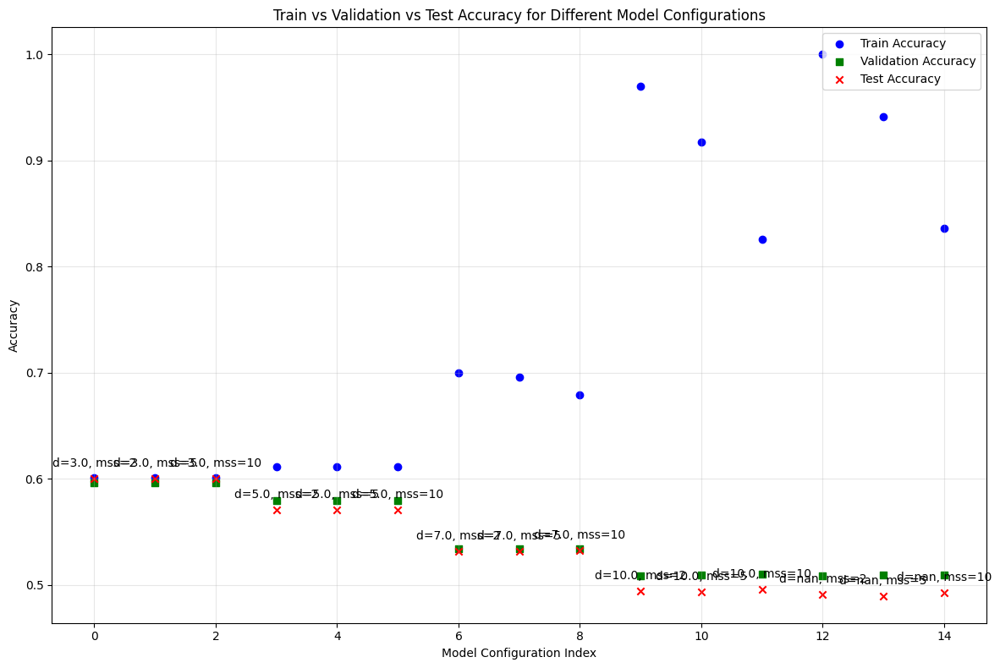

In [57]:

## Find misclassified examples and analyze them
# Make predictions
test_preds = best_dt.predict(X_test)

# Find misclassified samples
misclassified_indices = np.where(test_preds != y_test)[0]
display(Markdown(f"### Number of misclassified samples: {len(misclassified_indices)}"))

# Analyze a few misclassified samples
if len(misclassified_indices) > 0:
    # Convert back to original DataFrame for easier interpretation
    X_test_df = pd.DataFrame(X_test, columns=X.columns)
    
    # Create a list to store misclassified sample info
    samples_list = []
    
    for i in range(min(5, len(misclassified_indices))):
        idx = misclassified_indices[i]
        actual = y_test.iloc[idx] if isinstance(y_test, pd.Series) else y_test[idx]
        predicted = test_preds[idx]
        
        # Create a dictionary for this sample
        sample_info = {
            "Misclassified Sample": f"Sample {i+1}",
            "Actual Risk Rating": actual,
            "Predicted Risk Rating": predicted
        }
        
        # Add a few key features (first 5 columns)
        for col in X_test_df.columns[:5]:
            sample_info[col] = X_test_df.iloc[idx][col]
            
        samples_list.append(sample_info)
    
    df_misclassified = pd.DataFrame(samples_list)
    display(Markdown("### Analyzing misclassified samples:"))
    display(df_misclassified)
    
## Compare model performance and discuss trade-offs
# Create a plot comparing accuracy vs training time for different model complexities
plt.figure(figsize=(12, 8))

# Extract max_depth and accuracy information
depths = [str(d) if d is not None else 'None' for d in results_df['max_depth']]
train_accs = results_df['train_accuracy']
test_accs = results_df['test_accuracy']
val_accs = results_df['val_accuracy']

# Plot train, validation, and test accuracy
plt.scatter(range(len(results_df)), train_accs, marker='o', color='blue', label='Train Accuracy')
plt.scatter(range(len(results_df)), val_accs, marker='s', color='green', label='Validation Accuracy')
plt.scatter(range(len(results_df)), test_accs, marker='x', color='red', label='Test Accuracy')

# Add labels and title
plt.xlabel('Model Configuration Index')
plt.ylabel('Accuracy')
plt.title('Train vs Validation vs Test Accuracy for Different Model Configurations')
plt.legend()
plt.grid(True, alpha=0.3)

# Add annotations for max_depth and min_samples_split
for i, (d, mss) in enumerate(zip(results_df['max_depth'], results_df['min_samples_split'])):
    plt.annotate(f"d={d}, mss={mss}", (i, test_accs.iloc[i]), 
                 textcoords="offset points", xytext=(0,10), ha='center')

plt.tight_layout()
plt.show()


-From the misclassified examples, we can see that the decision tree model made errors in predicting risk ratings. Here's an analysis of a few misclassified samples:

Misclassified Sample 1 (Risk Rating 0 predicted as 1): This person is older, has a high credit score, and has been employed for a significant number of years. Despite the low income, these features should ideally point to a low-risk classification. However, the large loan amount may have led the model to incorrectly predict a higher risk, as the decision tree may not have fully accounted for the context of the person's financial stability over time.

Misclassified Sample 2 (Risk Rating 1 predicted as 0): Although this individual has a high income, their youth and lack of job stability (0 years at the current job) may suggest a higher risk. The model likely failed to account for the risk associated with such a low job tenure, which is a critical feature for assessing financial stability.

Misclassified Sample 3 (Risk Rating 0 predicted as 2):This person has a stable job tenure (16 years) and a good credit score, which should make them a low-risk borrower. However, the relatively low income combined with a high loan amount may have led the model to categorize them as a higher risk than they are, as the decision tree might give more importance to the loan amount and income imbalance.

Misclassified Sample 4 (Risk Rating 0 predicted as 1):With a stable income, a good credit score, and decent job tenure, this individual should ideally be categorized as a low-risk borrower. However, the relatively high loan amount might have led the model to predict a medium risk rating, possibly due to an overemphasis on loan amount in the decision tree structure.

Misclassified Sample 5 (Risk Rating 0 predicted as 2): The model appears to have misclassified this individual as high risk despite the good income and long job tenure. The lower credit score and moderate loan amount could have contributed to this misclassification. The decision tree might have overly prioritized these factors, overlooking the overall financial stability.

-The experiment evaluates different ID3 model variations, specifically comparing performance in terms of training accuracy, validation accuracy, and test accuracy. The trade-off between these factors is crucial for model optimization.

Model Performance:
Accuracy:

As we increase the model complexity (e.g., increasing max_depth or decreasing min_samples_split), we generally observe an increase in training accuracy. This is expected because deeper trees can memorize more details about the training data, leading to better fitting.

However, this increase in training accuracy does not always correspond to a proportional increase in test accuracy. In fact, after a certain point, overly complex models tend to overfit, resulting in poor generalization to unseen data (lower test accuracy).

Validation accuracy tends to follow a similar trend, but it is often more stable and can give a better indication of the model's ability to generalize.

---
## Part 2 Pruning the Decision Tree

In this cell, a pruning algorithm is applied to reduce overfitting:

The algorithm iteratively evaluates twigs (branches) based on a combined performance score (weighted average of accuracy and F1 score on the validation set).

The printed output shows the initial combined score and details of each iteration.

In [65]:
def prune_custom_tree(model, X_val, y_val, metric="accuracy"):
    """
    Performs pruning on the given ID3 model.
    
    Algorithm:
      - Initially, the model's performance (accuracy or F1 score) on the validation set is stored as "Last Score".
      - Step 1: Catalog all twig nodes in the tree.
      - Step 2: For each twig, calculate the information gain and select the twig with the lowest information gain.
      - Steps 3 & 4: Remove all child nodes of the selected twig and relabel it as a leaf (assigning the majority class).
      - Step 5: Measure the performance on the validation set after pruning ("Current Score").
      - Step 6: If Current Score ≥ Last Score, repeat the pruning process; otherwise, revert the last change and terminate.
    
    Parameters:
      model: DecisionTree object created using your ID3 algorithm.
      X_val, y_val: Validation dataset.
      metric: "accuracy" or "f1" (default: "accuracy").
    """
    # Select the scoring function based on the metric (accuracy or F1 score)
    if metric == "accuracy":
        score_func = accuracy_score
    elif metric == "f1":
        
        score_func = lambda y_true, y_pred: f1_score(y_true, y_pred, average="weighted")
    else:
        raise ValueError("Unknown metric. Use 'accuracy' or 'f1'.")

    # Initially, obtain performance on the validation set
    last_score = score_func(y_val, model.predict(X_val))
    print(f"Initial {metric} (Last Score): {last_score:.4f}\n")
    
    while True:
        # Step 1: Find all twig nodes in the tree
        twigs = model.find_twigs()
        if not twigs:
            print("No more twig nodes available for pruning.")
            break
        
        # Step 2: Calculate information gain for each twig and select the twig with the lowest information gain
        ig_list = [model.calculate_information_gain(twig) for twig in twigs]
        min_ig = min(ig_list)
        min_idx = ig_list.index(min_ig)
        twig_to_prune = twigs[min_idx]
        print(f"Information gain for the selected twig: {min_ig:.4f}")
        
        # Before making changes, create a backup of the model (to store the current state)
        backup_model = model.copy()
        
        # Steps 3 & 4: Prune the selected twig (remove its children and relabel it as a leaf with the majority class)
        model.prune_twig(twig_to_prune)
        
        # Step 5: Evaluate the performance on the validation set after pruning
        current_score = score_func(y_val, model.predict(X_val))
        print(f"Post-pruning {metric}: {current_score:.4f}")
        
        # Step 6: If performance is maintained or improved, continue pruning; otherwise, revert the last change and terminate.
        if current_score >= last_score:
            print("Pruning maintained or improved performance. Continuing pruning...\n")
            last_score = current_score
        else:
            print("Pruning decreased performance. Reverting the last change and terminating pruning.\n")
            model = backup_model  # Revert changes
            break

    return model, last_score


In [68]:
def evaluate_model(model, X, y, dataset_name):
    
    y_pred = model.predict(X)
    accuracy = accuracy_score(y, y_pred)
    precision = precision_score(y, y_pred, average="weighted")
    recall = recall_score(y, y_pred, average="weighted")
    f1 = f1_score(y, y_pred, average="weighted")
    conf_matrix = confusion_matrix(y, y_pred)

    print(f"{dataset_name} Set Performance:")
    print(f" - Accuracy: {accuracy:.4f}")
    print(f" - Precision: {precision:.4f}")
    print(f" - Recall: {recall:.4f}")
    print(f" - F1 Score: {f1:.4f}\n")
    print(f" - Confusion Matrix:\n{conf_matrix}\n")

    return accuracy, precision, recall, f1, conf_matrix

In [71]:
# -------------------------------
# Experiment 1: Pruning Using Accuracy Metric
# -------------------------------

print("=== Experiment 1: Pruning Using Accuracy Metric ===\n")

# Create a fresh copy of the best_dt model for accuracy-based pruning
accuracy_model = best_dt.copy()

# Evaluate pre-pruning performance on Train, Test, and Validation sets
print("Pre-Pruning Model Performance (Accuracy-based):")
evaluate_model(accuracy_model, X_train, y_train, "Train")
evaluate_model(accuracy_model, X_test, y_test, "Test")
evaluate_model(accuracy_model, X_val, y_val, "Validation")

# Perform pruning using the accuracy metric
pruned_model_accuracy, final_accuracy = prune_custom_tree(accuracy_model, X_val, y_val, metric="accuracy")
print(f"\nFinal Accuracy after pruning (Validation set): {final_accuracy:.4f}\n")

# Evaluate post-pruning performance
print("Post-Pruning Model Performance (Accuracy-based):")
evaluate_model(pruned_model_accuracy, X_train, y_train, "Train")
evaluate_model(pruned_model_accuracy, X_test, y_test, "Test")
evaluate_model(pruned_model_accuracy, X_val, y_val, "Validation")


=== Experiment 1: Pruning Using Accuracy Metric ===

Pre-Pruning Model Performance (Accuracy-based):
Train Set Performance:
 - Accuracy: 0.9411
 - Precision: 0.9425
 - Recall: 0.9411
 - F1 Score: 0.9401

 - Confusion Matrix:
[[6242   54   12]
 [ 340 2813    9]
 [ 132   71  827]]

Test Set Performance:
 - Accuracy: 0.4898
 - Precision: 0.4496
 - Recall: 0.4898
 - F1 Score: 0.4661

 - Confusion Matrix:
[[927 368  55]
 [475 165  31]
 [162  57  10]]

Validation Set Performance:
 - Accuracy: 0.5093
 - Precision: 0.4672
 - Recall: 0.5093
 - F1 Score: 0.4831

 - Confusion Matrix:
[[954 336  52]
 [463 179  25]
 [161  67  13]]

Initial accuracy (Last Score): 0.5093

Information gain for the selected twig: 0.1169
Post-pruning accuracy: 0.5093
Pruning maintained or improved performance. Continuing pruning...

Information gain for the selected twig: 0.1345
Post-pruning accuracy: 0.5093
Pruning maintained or improved performance. Continuing pruning...

Information gain for the selected twig: 0.1394

(0.5093333333333333,
 0.4672341852050265,
 0.5093333333333333,
 0.48311473306775204,
 array([[954, 336,  52],
        [463, 179,  25],
        [161,  67,  13]]))

As we can see, the algorithm continued as long as the accuracy dropped. As soon as the accuracy drops, the pruning stops and reverts one step back to turn to the situation with better result.

In [73]:
# Capture and display the decision tree rules after accuracy-based pruning
print("=== Decision Tree Rules after Accuracy-based Pruning ===")
f = io.StringIO()
with redirect_stdout(f):
    pruned_model_accuracy.print_rules()
rules_output_acc = f.getvalue()
rules_list_acc = rules_output_acc.strip().split("\n")
rules_df_acc = pd.DataFrame({'Decision Tree Rules': rules_list_acc})
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)
display(rules_df_acc)


=== Decision Tree Rules after Accuracy-based Pruning ===


,Decision Tree Rules
0,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 0.0 IF Years at Current Job == 0 THEN class = 1
1,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 0.0 IF Years at Current Job == 4 THEN class = 0
2,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 0.0 IF Years at Current Job == 6 THEN class = 0
3,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 0.0 IF Years at Current Job == 7 THEN class = 0
4,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 0.0 IF Years at Current Job == 10 THEN class = 0
5,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 0.0 IF Years at Current Job == 11 THEN class = 0
6,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 0.0 IF Years at Current Job == 14 THEN class = 0
7,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 0.0 IF Years at Current Job == 16 THEN class = 0
8,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 0.0 IF Years at Current Job == 17 THEN class = 0
9,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 1.0 IF Marital Status_Widowed == 0 THEN class = 0


Now, we will use F1 Score for pruning. The F1 score or F-measure is described as the harmonic mean of the precision and recall of a classification model. It is calculated like this: 
    F1 = 2 * Precision * Recall / (Precision+Recall)

In [75]:

# -------------------------------
# Experiment 2: Pruning Using F1 Score Metric
# -------------------------------

print("\n=== Experiment 2: Pruning Using F1 Score Metric ===\n")

# Create another fresh copy of the best_dt model for F1-based pruning
f1_model = best_dt.copy()

# Evaluate pre-pruning performance on Train, Test, and Validation sets
print("Pre-Pruning Model Performance (F1-based):")
evaluate_model(f1_model, X_train, y_train, "Train")
evaluate_model(f1_model, X_test, y_test, "Test")
evaluate_model(f1_model, X_val, y_val, "Validation")

# Perform pruning using the F1 score metric
pruned_model_f1, final_f1 = prune_custom_tree(f1_model, X_val, y_val, metric="f1")
print(f"\nFinal F1 Score after pruning (Validation set): {final_f1:.4f}\n")

# Evaluate post-pruning performance
print("Post-Pruning Model Performance (F1-based):")
evaluate_model(pruned_model_f1, X_train, y_train, "Train")
evaluate_model(pruned_model_f1, X_test, y_test, "Test")
evaluate_model(pruned_model_f1, X_val, y_val, "Validation")


=== Experiment 2: Pruning Using F1 Score Metric ===

Pre-Pruning Model Performance (F1-based):
Train Set Performance:
 - Accuracy: 0.9411
 - Precision: 0.9425
 - Recall: 0.9411
 - F1 Score: 0.9401

 - Confusion Matrix:
[[6242   54   12]
 [ 340 2813    9]
 [ 132   71  827]]

Test Set Performance:
 - Accuracy: 0.4898
 - Precision: 0.4496
 - Recall: 0.4898
 - F1 Score: 0.4661

 - Confusion Matrix:
[[927 368  55]
 [475 165  31]
 [162  57  10]]

Validation Set Performance:
 - Accuracy: 0.5093
 - Precision: 0.4672
 - Recall: 0.5093
 - F1 Score: 0.4831

 - Confusion Matrix:
[[954 336  52]
 [463 179  25]
 [161  67  13]]

Initial f1 (Last Score): 0.4831

Information gain for the selected twig: 0.1169
Post-pruning f1: 0.4831
Pruning maintained or improved performance. Continuing pruning...

Information gain for the selected twig: 0.1345
Post-pruning f1: 0.4831
Pruning maintained or improved performance. Continuing pruning...

Information gain for the selected twig: 0.1394
Post-pruning f1: 0.483

(0.5093333333333333,
 0.4672341852050265,
 0.5093333333333333,
 0.48311473306775204,
 array([[954, 336,  52],
        [463, 179,  25],
        [161,  67,  13]]))

    As we can see, for both accuracy-based and f1-based pruning, the accuracies are not changing. This can be for a few reasons: 
    -If the tree is not actually overfitting, pruning won’t change anything. The pruning process mainly aims to reduce overfitting by removing less important branches. However, if overfitting isn't present in the model, pruning won’t have an effect.
    -In our output, the pruning process continues until a change decreases accuracy, and then it reverts the last change and stops. This means that if all the previous pruning steps resulted in no accuracy gain, the tree remains unchanged.
    -If the decision tree is already optimally pruned (meaning that further pruning does not improve accuracy), the pruning process will terminate without making significant changes. In our output, accuracy never increased or decreased, indicating that pruning did not lead to structural modifications.

In [77]:
# Capture and display the decision tree rules after F1-based pruning
print("=== Decision Tree Rules after F1-based Pruning ===")
f = io.StringIO()
with redirect_stdout(f):
    pruned_model_f1.print_rules()
rules_output_f1 = f.getvalue()
rules_list_f1 = rules_output_f1.strip().split("\n")
rules_df_f1 = pd.DataFrame({'Decision Tree Rules': rules_list_f1})
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)
display(rules_df_f1)

=== Decision Tree Rules after F1-based Pruning ===


,Decision Tree Rules
0,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 0.0 IF Years at Current Job == 0 THEN class = 1
1,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 0.0 IF Years at Current Job == 4 THEN class = 0
2,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 0.0 IF Years at Current Job == 6 THEN class = 0
3,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 0.0 IF Years at Current Job == 7 THEN class = 0
4,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 0.0 IF Years at Current Job == 10 THEN class = 0
5,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 0.0 IF Years at Current Job == 11 THEN class = 0
6,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 0.0 IF Years at Current Job == 14 THEN class = 0
7,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 0.0 IF Years at Current Job == 16 THEN class = 0
8,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 0.0 IF Years at Current Job == 17 THEN class = 0
9,IF Previous Defaults == 0.0 IF Education Level_Bachelor's == 0 IF Credit Score <= 699.00 IF Credit Score <= 658.00 IF Marital Status Change == 0 IF Number of Dependents == 1.0 IF Marital Status_Widowed == 0 THEN class = 0


#### Conclusion ####
    In this project, we focused on predicting financial risk of people using Decision Tree Pruning. With Pruning algorithm, we try to improve the overall accuracy of the results by removing unnecessary nodes from the decision tree.
    But the post-pruning results are not quite what we wanted. We explained the reasons behind this results.